# «Quantitative Evaluation of XAI Methods for Image Segmentation in Autonomous Driving»

### Bachelor Thesis Implementation - Methods and Metrics (Phase 2 and 3) 
##### *IMAGE 2 (Person)*

Liridona Cerkini - 
Rotkreuz, May 30th, 2025

### Intro
This notebook documents Phase 2 and 3 of the research, focusing on the evaluation of Explainable AI (XAI) methods for semantic segmentation in autonomous driving scenarios. Building upon the model application in Phase 1, this phase aims to assess varaious XAI techniques in terms of interpretability and effectiveness.

Several XAI methods have been selected based on their relevance to segmentation tasks and prior research findings. The methods under consideration include LIME, Grad-CAM, Seg-Grad-CAM, Saliency (Vanilla Gradient), XRAI, L-CRP, and Integrated Gradients (IG). Each method offers a distinct approach to explainability, ranging from pixel-based attribution (e.g., Saliency, IG) to region-based interpretations (e.g., XRAI, L-CRP). 

### Objectives
- Systematically evaluate the interpretability, robustness, and explanatory fidelity of XAI methods for semantic segmentation tasks.
  The evaluation will include:
    - Comparing attribution maps generated by different XAI methods with the model’s segmentation outputs.
    - Assessing faithfulness using IROF (Impact of Removal on Fidelity) and robustness through Max-Sensitivity.
    - Evaluating localization accuracy using the Pointing Game and Focus metrics to detect accurate attribution as well as misfocus errors and potential model biases.
    - Measuring Effective Complexity to determine how many features are required to explain the prediction without significantly reducing model accuracy.
    - Identifying the strengths and limitations of each method in explaining segmentation predictions.

### Data
- Images from the Mapillary Vistas dataset (Neuhold et al., 2017) were segmented using OneFormer.
- Additionally, Deeplabv3 was applied in later stages for method evaluation.

### Methodology
- Selection of XAI methods: Methods are chosen based on previous research and applicability to semantic segmentation tasks.
- Implementation: Methods are sourced from established repositories, including Captum (for LIME, Saliency, and Grad-CAM), Seg-Grad-CAM, L-CRP, and Google’s Saliency library (for XRAI).
- Comparative Analysis: Generated attribution maps will be compared using predefined evaluation metrics to assess their alignment with model predictions and segmentation outputs.
- Metrics and Evaluation:
To assess the XAI methods, a set of metrics will be applied to evaluate the accuracy and reliability of each method. These metrics include:
    - Max-Sensitivity (Yeh et al., 2019): Measures the stability of explanations under slight input perturbations, falling under the robustness category.
    - IROF (Rieger & Hansen, 2020): Evaluates the faithfulness of the explanation by assessing the impact of feature removal on classification accuracy.
    - Pointing Game (Zhang et al., 2016): Assesses localisation accuracy by verifying if the highest attribution score corresponds to the target object.
    - Focus (Arias-Duart et al., 2022): A localisation metric that identifies misfocus errors, revealing model biases through mosaic data.
    - Effective Complexity (Nguyen & Martínez, 2020): Measures how many features are necessary to explain the prediction without deviating too much from model accuracy.

These XAI-specific metrics are critical for understanding the strengths and weaknesses of each method in a segmentation context, complementing standard evaluation metrics like IoU and pixel accuracy.

### Datasets Used
- Neuhold, G., Ollmann, T., Bulo, S. R., & Kontschieder, P. (2017). The Mapillary Vistas Dataset for Semantic Understanding of Street Scenes. 2017 IEEE International Conference on Computer Vision (ICCV), 5000–5009. https://doi.org/10.1109/ICCV.2017.534

### Additional Sources
- OneFormer: http://arxiv.org/abs/2211.06220
- HuggingFace: https://huggingface.co/
- OneFormer Benchmark (via Paperswithcode): https://paperswithcode.com/paper/oneformer-one-transformer-to-rule-universal
##### GitHub Repositories for XAI Methods
- LIME, Saliency, and Grad-CAM (LayerGradCAM) via Captum: https://github.com/pytorch/captum
- Seg-Grad-CAM: https://github.com/kiraving/SegGradCAM
- L-CRP: https://github.com/maxdreyer/LCRP
- XRAI via Google’s Saliency Library: https://github.com/PAIR-code/saliency
- Integrated Gradients: https://github.com/ankurtaly/Integrated-Gradients
##### Metrics using XAI toolkit Quantus (Hedström et al., 2023)
- Max-Sensitivity (Yeh et al., 2019)
- IROF (Rieger & Hansen, 2020)
- Pointing Game (Zhang et al., 2016)
- Focus (Arias-Duart et al., 2022)
- Effective Complexity (Nguyen & Martínez, 2020

via Quantus https://github.com/understandable-machine-intelligence-lab/Quantus

### Importing Libraries

In [1]:
# Package Installation
!pip install transformers
!pip install opencv-python
!pip install --upgrade grad-cam

# Install Captum library for LIME, Saliency, and Grad-CAM (LayerGradCAM)
!pip install captum  # GitHub: https://github.com/pytorch/captum

# Install XRAI from Google's Saliency library for TensorFlow
!pip install saliency[tf1]  # GitHub: https://github.com/pair-code/saliency

# Optional: Clone the L-CRP repository and preprocessing files
# !git clone https://github.com/maxdreyer/L-CRP.git  # GitHub: https://github.com/maxdreyer/L-CRP

# Warnings
import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

# Standard Library
import gc
import os
import random
import time
from datetime import datetime

# Scientific Computing & Utilities
import numpy as np
import pandas as pd
from tqdm import tqdm
import requests

# PyTorch & TorchVision
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from torchvision import models, transforms
from torchvision.models.segmentation import deeplabv3_resnet50

# Captum XAI
from captum.attr import IntegratedGradients, LayerGradCam, Lime, Saliency
from captum._utils.models.linear_model import SkLearnLasso

# Grad-CAM
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import preprocess_image, show_cam_on_image

# XRAI Saliency (TensorFlow-based)
import saliency.core as saliency
from saliency.core import INPUT_OUTPUT_GRADIENTS, XRAI
from saliency.core.base import INPUT_OUTPUT_GRADIENTS  # required for XRAI

# Image Processing & Visualization
import cv2
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.gridspec as gridspec
from PIL import Image
from skimage import exposure
from skimage.segmentation import felzenszwalb
from IPython.display import display

In [2]:
# Define global seed for full reproducibility across NumPy, Python, and PyTorch
SEED = 42
np.random.seed(SEED)
random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

### Load pretrained Model OneFormer

In [3]:
# Transformers – Load OneFormer for Universal Segmentation
from transformers import OneFormerProcessor, OneFormerForUniversalSegmentation

# Device Configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.cuda.empty_cache()

# Load OneFormer Processor and Model (Cityscapes pretrained)
processor = OneFormerProcessor.from_pretrained("shi-labs/oneformer_cityscapes_swin_large")
model = OneFormerForUniversalSegmentation.from_pretrained(
    "shi-labs/oneformer_cityscapes_swin_large"
).to(device)
# model.eval()  # Uncomment if running inference without training

2025-05-01 06:25:39.496437: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1746080739.514002    3597 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1746080739.519419    3597 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1746080739.533080    3597 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1746080739.533097    3597 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1746080739.533099    3597 computation_placer.cc:177] computation placer alr

### Select the image

Width: 408 pixels
Height: 306 pixels


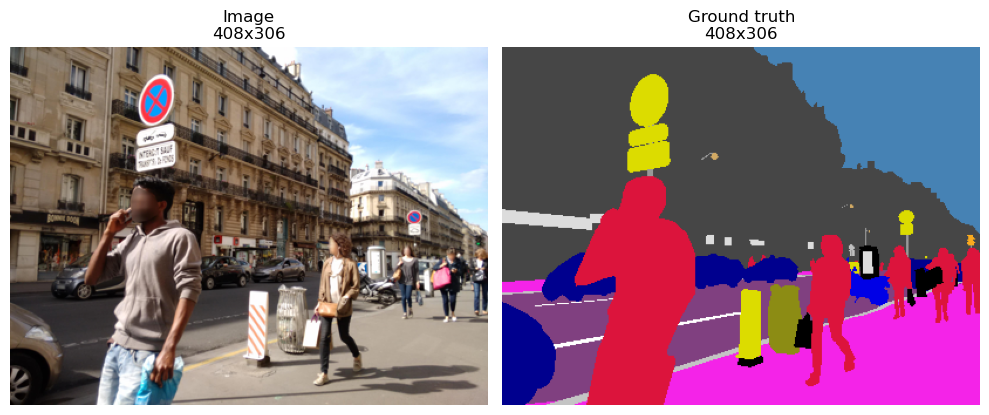

In [4]:
# Paths to Input Image and Ground Truth Label
image_path = 'images/C3fao_-9rHFlTCldCc_neQ.jpg'
label_path = 'labels/C3fao_-9rHFlTCldCc_neQ.png'

# Target resize dimensions (width, height)
target_size = (408, 306)

# Load and preprocess the image
image = Image.open(image_path).convert("RGB").resize(target_size)
label = Image.open(label_path).resize(target_size, resample=Image.NEAREST)

# Retrieve original image dimensions
width, height = image.size

# Normalize image and convert to PyTorch tensor
image_np = np.array(image).astype(np.float32) / 255.0  # Normalize to [0, 1]
image_tensor = torch.tensor(image_np).permute(2, 0, 1).unsqueeze(0)  # Shape: (1, C, H, W)

# Print image dimensions
print("Width:", width, "pixels")
print("Height:", height, "pixels")

# Visualize the image and corresponding label side-by-side
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Display original image
axes[0].imshow(image)
axes[0].set_title(f"Image\n{width}x{height}")
axes[0].axis('off')

# Display segmentation label
axes[1].imshow(label)
axes[1].set_title(f"Ground truth\n{width}x{height}")
axes[1].axis('off')

plt.tight_layout()
plt.show()

Since the ground truth has already been determined in Part 1, we will now directly apply the model to the selected image.

#### Search and Replace
When segmenting an image using a model, each pixel is assigned a class. The colors identified in the ground truth will now be replaced with the corresponding class numbers.

In [5]:
# Initialize dictionary to store processed masks (for OneFormer)
mask_dict = {}

# Define mapping from RGB colors to Cityscapes class indices (selected subset)
color_to_class_city = {
    (220, 20, 60): 11,   # Person
    (250, 170, 30): 6,   # Traffic Light
    (220, 220, 0): 7,    # Traffic Sign (Front)
    (119, 11, 32): 18,   # Bicycle
    (244, 35, 232): 1,   # Sidewalk
    (0, 0, 142): 13      # Car
}

# Load and resize label image to match model input size
ground_truth = Image.open(label_path).resize(target_size, resample=Image.NEAREST)

# Convert label image to RGB format (needed for color mapping)
ground_truth_rgb = np.array(ground_truth.convert("RGB"))

# Initialize a blank mask with same height/width, filled with zeros
replaced_mask_tensor = np.zeros(ground_truth_rgb.shape[:2], dtype=int)

# Iterate through each pixel and map RGB values to class indices
for i, j in np.ndindex(ground_truth_rgb.shape[:2]):
    pixel_color = tuple(ground_truth_rgb[i, j])
    if pixel_color in color_to_class_city:
        replaced_mask_tensor[i, j] = color_to_class_city[pixel_color]

# Store the resulting class-index mask in the dictionary using image path as key
mask_dict[image_path] = replaced_mask_tensor

# Output image metadata
print(f"Image name: {image_path}")
print(f"Mask shape (after resizing): {replaced_mask_tensor.shape}")

Image name: images/C3fao_-9rHFlTCldCc_neQ.jpg
Mask shape (after resizing): (306, 408)


To ensure that the mapping has been applied correctly, the unique class values are displayed:

In [6]:
# Get the first key from the dictionary
first_key = list(mask_dict.keys())[0]

# Calculate the shape and length of the tensor for the first key
first_mask = mask_dict[first_key]
print(f"First mask: {first_key}, Shape: {first_mask.shape}")

# Initialize a list to collect all values
all_values = []

# Collect all values from the tensors in the dictionary
for mask in mask_dict.values():
    all_values.extend(mask.flatten())  # Extract values from the mask and append them to the list

# Extract unique values
unique_values = np.unique(all_values)

# Display unique values
print(f"Unique class values in the masks: {unique_values}")

First mask: images/C3fao_-9rHFlTCldCc_neQ.jpg, Shape: (306, 408)
Unique class values in the masks: [ 0  1  6  7 11 13]


The selected image contains the following unique class values in the segmentation mask:

- **0**: Background (no specific object assigned)
- **1**: Sidewalk
- **6**: Traffic Light
- **7**: Traffic Sign (Front)
- **11**: Person
- **13**: Car

### Semantic Segmentation

The class mapping has been applied. We will now proceed with the actual segmentation.

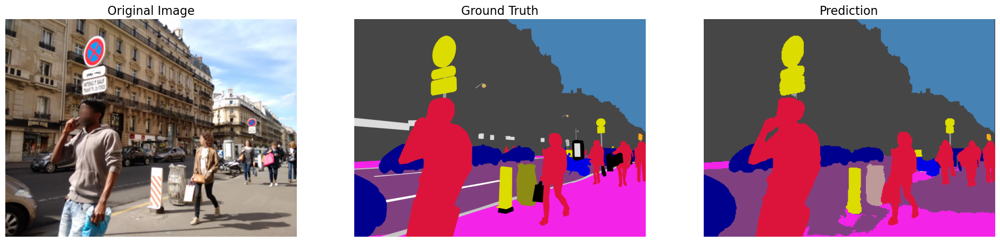

In [7]:
# Semantic segmentation with OneFormer
inputs = processor(image, ["semantic"], return_tensors="pt").to(device)
with torch.no_grad():
    outputs = model(**inputs)

# Extract the predicted semantic segmentation mask
predicted_semantic_map = processor.post_process_semantic_segmentation(
    outputs, target_sizes=[(image.height, image.width)]
)[0]

# Color mapping for labels
label_colors = {
    0: (128, 64, 128),   # Road
    1: (244, 35, 232),   # Sidewalk
    2: (70, 70, 70),     # Building
    3: (102, 102, 156),  # Wall
    4: (190, 153, 153),  # Fence
    5: (153, 153, 153),  # Pole
    6: (250, 170, 30),   # Traffic Light
    7: (220, 220, 0),    # Traffic Sign
    8: (107, 142, 35),   # Vegetation
    9: (152, 251, 152),  # Terrain
    10: (70, 130, 180),  # Sky
    11: (220, 20, 60),   # Person
    12: (255, 0, 0),     # Rider
    13: (0, 0, 142),     # Car
    14: (0, 0, 70),      # Truck
    15: (0, 60, 100),    # Bus
    16: (0, 80, 100),    # Train
    17: (0, 0, 230),     # Motorcycle
    18: (119, 11, 32)    # Bicycle
}

# Function to convert class indices into a color image
def apply_color_map(segmentation_map, label_colors):
    """Converts a predicted segmentation map into a colored RGB image."""
    height, width = segmentation_map.shape
    rgb_map = np.zeros((height, width, 3), dtype=np.uint8)

    for label, color in label_colors.items():
        rgb_map[segmentation_map == label] = color  # Assigns the corresponding color

    return rgb_map

# Define the path to the ground truth mask (label map)
label_path = 'labels/C3fao_-9rHFlTCldCc_neQ.png'

# Load the ground truth mask
label_map = Image.open(label_path)

# Convert `predicted_semantic_map` to a NumPy array if necessary
if isinstance(predicted_semantic_map, torch.Tensor):
    predicted_semantic_map = predicted_semantic_map.cpu().numpy()

# Apply the color mapping
colored_pred_map = apply_color_map(predicted_semantic_map, label_colors)

# Visualization
fig, ax = plt.subplots(1, 3, figsize=(24, 6)) 

# Original image
ax[0].imshow(image)
ax[0].set_title("Original Image", fontsize=16)
ax[0].axis("off")

# Ground truth label map
ax[1].imshow(label_map)
ax[1].set_title("Ground Truth", fontsize=16)
ax[1].axis("off")

# Predicted segmentation with colors
ax[2].imshow(colored_pred_map)
ax[2].set_title("Prediction", fontsize=16)
ax[2].axis("off")

plt.show()

In [8]:
# Function to calculate IoU in percentage
def calculate_iou_percentage(pred_mask, true_mask, selected_classes):
    iou_results = {}

    # Ensure both masks are NumPy arrays
    pred_mask = np.array(pred_mask)
    true_mask = np.array(true_mask)

    for class_id in selected_classes:
        # Create binary masks for the selected classes
        pred_class_mask = (pred_mask == class_id).astype(int)
        true_class_mask = (true_mask == class_id).astype(int)

        # Compute intersection and union
        intersection = np.sum(pred_class_mask * true_class_mask)
        union = np.sum(pred_class_mask) + np.sum(true_class_mask) - intersection

        # Calculate IoU
        iou = intersection / union if union != 0 else 0
        iou_results[class_id] = iou * 100  # Convert to percentage
    
    return iou_results

# Display the shape of the first image and the mask values
print(f"First mask: {first_key}, Shape: {first_mask.shape}")

# Display unique class values in the masks
print(f"Unique class values in the masks: {unique_values}")

# Define the selected classes for IoU computation (based on unique values)
selected_classes = unique_values.tolist()

predicted_class_map = predicted_semantic_map  # Predicted mask
label_class_map = first_mask  # Ground truth mask

# Compute IoU for the current image
iou_results_percentage = calculate_iou_percentage(predicted_class_map, label_class_map, selected_classes)

# Print IoU results
print("IoU results in percentage:")
for class_id, iou in iou_results_percentage.items():
    print(f"Class {class_id}: {iou:.2f}%")

First mask: images/C3fao_-9rHFlTCldCc_neQ.jpg, Shape: (306, 408)
Unique class values in the masks: [ 0  1  6  7 11 13]
IoU results in percentage:
Class 0: 9.98%
Class 1: 41.61%
Class 6: 52.38%
Class 7: 86.19%
Class 11: 88.19%
Class 13: 91.73%


In [9]:
def inspect_target_layers(model, inputs):
    """
    Prints all potential target layers in the decoder that can be used for the methods,
    including their output shapes for a given input image.
    """

    device = torch.device("cpu")
    model.to(device)
    inputs = inputs.to(device)

    # Access the decoder module
    decoder = model.model.pixel_level_module.decoder
    print("Decoder components:", list(decoder._modules.keys()))

    # Dictionary to store activation shapes
    activation_shapes = {}

    # Create a hook function to capture outputs
    def make_hook(name):
        def hook_fn(module, input, output):
            if isinstance(output, torch.Tensor):
                activation_shapes[name] = tuple(output.shape)
            elif isinstance(output, (list, tuple)) and isinstance(output[0], torch.Tensor):
                activation_shapes[name] = tuple(output[0].shape)
            else:
                activation_shapes[name] = "Unknown type"
        return hook_fn

    # Register hooks for all leaf submodules in the decoder
    hooks = []
    for name, module in decoder.named_modules():
        if isinstance(module, nn.Module) and len(list(module.children())) == 0:
            hooks.append(module.register_forward_hook(make_hook(name)))

    # Run a forward pass to trigger the hooks
    with torch.no_grad():
        _ = model(**inputs)

    # Remove all hooks after execution
    for h in hooks:
        h.remove()

    # Print the results
    print("\nPotential target_layers with shape:")
    for name, shape in activation_shapes.items():
        print(f"{name:<40} → {shape}")

In [10]:
# inspect_target_layers(model, inputs) # Uncomment to inspect all decoder layers and their output shapes

## XAI – Attempt with OneFormer and Switch to DeepLabv3
To apply Methods successfully, it is essential to identify the correct target feature layer that correlates with the spatial resolution of the input image — for instance, `decoder_last_feature` or `mask_features` in OneFormer. Therefore, all potential `target_layers` should be tested and their output shapes examined to determine which ones align with the input image dimensions.

To enable methods, potential target layers with a 4D feature tensor format (Batch × Channels × Height × Width) were manually inspected:
- `layer_1.0` [1, 256, 256, 342]  
- `layer_1.1` [1, 256, 256, 342]  
- `layer_1.2` [1, 256, 256, 342]  
- `mask_projection` [1, 256, 256, 342]  
- `adapter_1.0` [1, 256, 256, 342]  

Although these layers appeared suitable in theory, Grad-CAM for instance could not be applied successfully due to the following limitations:

- Gradient backpropagation failed: .grad values were None
- Mapping between segmentation classes and mask outputs was unclear
- Internal model structure was too complex and deeply nested
- Hugging Face provides OneFormer as an abstracted wrapper optimized for inference — not for explainable AI or access to internal layers. As a result, the internal components are heavily abstracted, and no clear mapping can be established between individual queries and segmentation classes in the logit output.
- In addition, Grad-CAM caused Out Of Memory errors due to OneFormer's large memory footprint (Transformer-based, multi-scale decoder), which requires storing both feature maps and gradients.

**Conclusion: For the application of explainable AI (XAI) methods, a classical model such as DeepLabv3 must be used.**

In [11]:
# Preprocess image
image = Image.open(image_path).convert("RGB").resize((408,306))
image_np = np.array(image).astype(np.float32) / 255.0
input_tensor = preprocess_image(image_np, mean=[0.485, 0.456, 0.406],
                                std=[0.229, 0.224, 0.225])

### Load pretrained Model Deeplabv3

In [12]:
# Load model Deeplabv3
model = deeplabv3_resnet50(pretrained=True, progress=False)
model = model.eval()

if torch.cuda.is_available():
    model = model.cuda()
    input_tensor = input_tensor.cuda()

output = model(input_tensor)
print(type(output), output.keys())

<class 'collections.OrderedDict'> odict_keys(['out', 'aux'])


This model doesn't return a plain tensor—instead, it outputs a dictionary containing keys like "out" and "aux". This is common in custom architectures: some models return dictionaries or tuples, where only part of the output is relevant.
In our case, we're only interested in the "out" key, which contains the main prediction.
To handle this properly, we'll wrap the model to extract only the part we need.

In [13]:
class SegmentationModelOutputWrapper(torch.nn.Module):
    def __init__(self, model): 
        super(SegmentationModelOutputWrapper, self).__init__()
        self.model = model
        
    def forward(self, x):
        return self.model(x)["out"]
    
model = SegmentationModelOutputWrapper(model)
output = model(input_tensor)

# Apply softmax to get class probabilities for each pixel, then move to CPU
normalized_masks = torch.nn.functional.softmax(output, dim=1).cpu()

To keep things practical, we’ll segment only the "person" class, which simplifies the application of subsequent analysis methods.

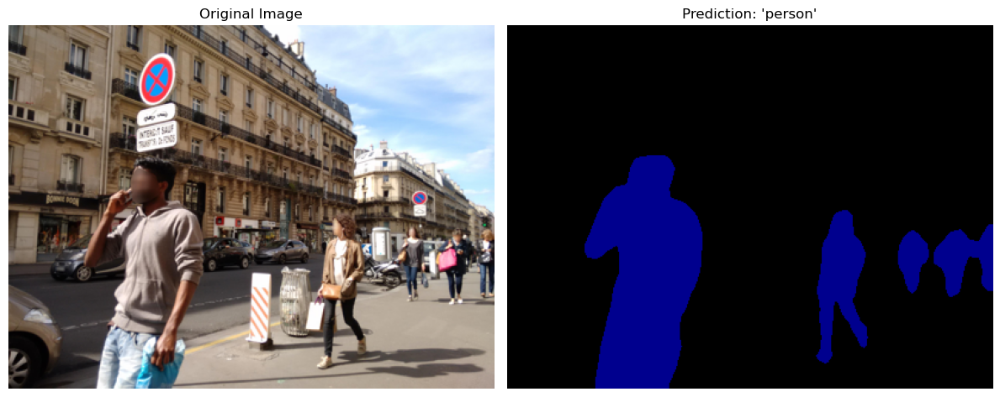

In [14]:
# Define the semantic segmentation classes (Pascal VOC-style)
sem_classes = [
    '__background__', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor'
]

# Create a mapping from class name to index
sem_class_to_idx = {cls: idx for (idx, cls) in enumerate(sem_classes)}
person_category = sem_class_to_idx["person"]

# Get predicted class mask (argmax over class scores)
person_mask = normalized_masks[0, :, :, :].argmax(axis=0).detach().cpu().numpy()

# Create binary mask for "person"
person_mask_float = np.float32(person_mask == person_category)

# Create a colored mask for visualization (e.g. Cityscapes blue for 'person')
colored_mask = np.zeros_like(np.array(image), dtype=np.uint8)
colored_mask[person_mask == person_category] = [0, 0, 142]  # RGB blue

# Plot both images side by side with separate titles
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Original image
ax1.imshow(np.array(image))
ax1.set_title("Original Image")
ax1.axis("off")

# Predicted "person" mask
ax2.imshow(colored_mask)
ax2.set_title("Prediction: 'person'")
ax2.axis("off")

plt.tight_layout()
plt.show()

In [15]:
def calculate_iou_percentage(pred_mask, true_mask, class_mappings):
    """
    Computes IoU (%) for given (pred_id, true_id) pairs.
    
    Args:
        pred_mask: predicted mask (2D array)
        true_mask: ground truth mask (2D array)
        class_mappings: list of (pred_id, true_id) tuples

    Returns:
        Dictionary with IoU percentages per class pair
    """
    iou_results = {}
    pred_mask = np.array(pred_mask)
    true_mask = np.array(true_mask)

    for pred_id, true_id in class_mappings:
        pred_bin = (pred_mask == pred_id).astype(int)
        true_bin = (true_mask == true_id).astype(int)

        intersection = np.sum(pred_bin * true_bin)
        union = np.sum(pred_bin) + np.sum(true_bin) - intersection

        iou_results[(pred_id, true_id)] = (intersection / union * 100) if union else 0

    return iou_results

In [16]:
# Predicted class map from DeepLabV3 (e.g., class ID 15 for "person")
predicted_class_map = person_mask  # shape: [H, W]

# Ground truth class map from the color-mapped label (e.g., class ID 11 for "person")
label_class_map = first_mask

# Calculate IoU for class "person": model predicts 15, ground truth uses 11
iou_results_percentage = calculate_iou_percentage(
    predicted_class_map,
    label_class_map,
    class_mappings=[(15, 11)]
)

# Display the IoU result
for (pred_id, true_id), iou in iou_results_percentage.items():
    print(f"IoU for 'person' (pred={pred_id}, gt={true_id}): {iou:.2f}%")

IoU for 'person' (pred=15, gt=11): 85.74%


#### Comparison of "person" segmentation performance:
Both models achieved excellent results in segmenting the "person" class.
OneFormer (class ID 11) achieved an IoU of 88.19%, slightly outperforming DeepLabV3 (class ID 15), which reached 85.73%. This highlights OneFormer's superior performance for this class, while confirming that both models deliver strong segmentation quality overall.

Next, we’ll apply the methods to highlight which parts of the image contributed most to the prediction. This helps us visually understand where the model is focusing. The resulting visualization helps to interpret and validate the model's attention mechanism and its decision process.

# Part 2 - Methods

In the following section, we apply explainability (XAI) techniques to visualize model attributions.
The focus is on the "person" class, represented as:
- Class 15 in DeepLabV3
- Class 11 in OneFormer

In [17]:
# Set target class ID (e.g., 15 = person in DeepLabV3)
person_class_id = 15

In [18]:
# Define a custom target for semantic segmentation
class SemanticSegmentationTarget:
    def __init__(self, category, mask):
        self.category = category
        self.mask = torch.from_numpy(mask)
        if torch.cuda.is_available():
            self.mask = self.mask.cuda()

    def __call__(self, model_output):
        return (model_output[self.category, :, :] * self.mask).sum()

The class SemanticSegmentationTarget defines a custom target for attribution in semantic segmentation. It focuses the explanation on a specific category (e.g. "person") within a given pixel mask. This is useful for isolating and interpreting model behavior in specific regions of interest, rather than across the whole output. It enables localized attribution methods like LIME to highlight which input areas contribute most to a certain class prediction.

## Lime

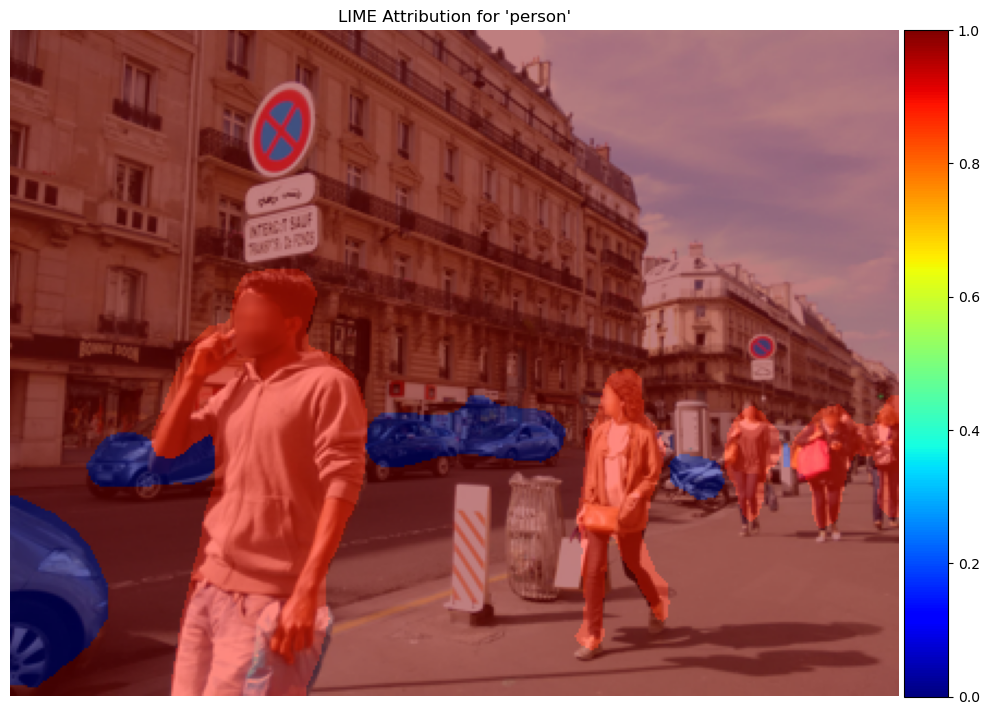

In [19]:
# Run model to get predictions (model returns a dictionary with "out")
with torch.no_grad():
    model_out = model(input_tensor)  # shape: [1, num_classes, H, W]

# Select the most likely class for each pixel
out_max = torch.argmax(model_out, dim=1, keepdim=True)  # shape: [1, 1, H, W]

# Wrapper function for LIME: focuses attribution on predicted class regions
def agg_segmentation_wrapper(inp):
    out = model(inp)
    selected_inds = torch.zeros_like(out).scatter_(1, out_max, 1)
    return (out * selected_inds).sum(dim=(2, 3))

# Initialize LIME with the wrapper and use a black image as the baseline
lime = Lime(agg_segmentation_wrapper)
baselines = torch.zeros_like(input_tensor)

# Run LIME to get attribution map for class "person"
lime_attr = lime.attribute(
    input_tensor,
    target=person_class_id,
    baselines=baselines,
    feature_mask=out_max,
    n_samples=100
)

# Normalize attribution values for visualization
lime_attr_norm = (lime_attr - lime_attr.min()) / (lime_attr.max() - lime_attr.min())
lime_attr_float = lime_attr_norm.detach().cpu().numpy().astype(np.float32)
lime_heatmap = lime_attr_float[0, 0]  # Extract the 2D heatmap
lime_heatmap_resized = cv2.resize(lime_heatmap, (input_tensor.shape[3], input_tensor.shape[2]))

# Threshold: Remove low-attribution background
threshold = 0.3  # You can tune this value
lime_heatmap_thresholded = np.where(lime_heatmap_resized > threshold, lime_heatmap_resized, 0)

# Unnormalize the input image (reverse ImageNet normalization)
input_image_np = np.transpose(input_tensor[0].detach().cpu().numpy(), (1, 2, 0))
input_image_np = (input_image_np * np.array([0.229, 0.224, 0.225]) +
                  np.array([0.485, 0.456, 0.406]))
input_image_np = np.clip(input_image_np, 0, 1)

# Overlay LIME heatmap onto the original image
lime_img = show_cam_on_image(input_image_np, lime_heatmap_thresholded, use_rgb=True)

# Display the attribution map with colorbar
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(lime_img)
ax.set_title("LIME Attribution for 'person'")
ax.axis("off")

# Add colorbar to indicate intensity of attribution
norm = Normalize(vmin=lime_heatmap_thresholded.min(), vmax=lime_heatmap_thresholded.max())
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
sm = ScalarMappable(cmap=plt.cm.jet, norm=norm)
sm.set_array([])
plt.colorbar(sm, cax=cax)

plt.tight_layout()
plt.show()

#### Observation Lime

To evaluate the interpretability of the model's segmentation for the class "person" (class ID 11), LIME attribution was applied.
The resulting heatmap shows strong and focused attribution over the main person instances, with well-preserved object contours and minimal background noise.
Notably, accessories such as a handbag are correctly attributed together with the corresponding person, demonstrating the model's capacity to include associated objects.
However, in areas farther from the camera, attribution becomes slightly less precise, particularly around the legs of distant individuals.
This highlights the model's challenges in maintaining fine-grained segmentation for small or less prominent persons.

## Grad-CAM

In [20]:
class GlobalSegmentationClassTarget:
    def __init__(self, category):
        self.category = category

    def __call__(self, model_output):
        # Dynamisch anpassbar für [C, H, W] oder [B, C, H, W]
        if model_output.ndim == 4:
            return model_output[:, self.category, :, :].mean()
        elif model_output.ndim == 3:
            return model_output[self.category, :, :].mean()
        else:
            raise ValueError(f"Unexpected model output shape: {model_output.shape}")


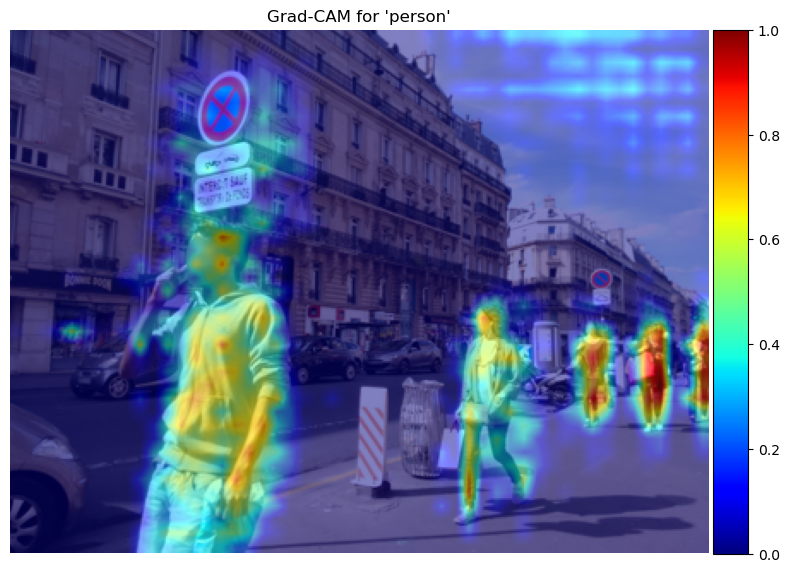

In [21]:
# Grad-CAM Setup für globales Target
target_layers = [list(model.model.backbone.children())[-1]]
targets_global = [GlobalSegmentationClassTarget(person_category)]

with GradCAM(model=model, target_layers=target_layers) as cam:
    grayscale_cam_global = cam(input_tensor=input_tensor, targets=targets_global)[0]
    cam_img_global = show_cam_on_image(image_np, grayscale_cam_global, use_rgb=True)

# Plot the Grad-CAM result
fig, ax = plt.subplots(figsize=(8, 8))
im = ax.imshow(cam_img_global)
ax.set_title("Grad-CAM for 'person'")
ax.axis("off")

# Add a colorbar with normalization from 0 to 1
norm = plt.Normalize(vmin=0.0, vmax=1.0)
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
sm = ScalarMappable(cmap=plt.cm.jet, norm=norm)
sm.set_array([])
plt.colorbar(sm, cax=cax)

plt.tight_layout()
plt.show()

The image provides a visual representation of the areas deemed significant by the model. Using Grad-CAM, it highlights regions of the image that contribute most to the model's predictions. The color gradient—ranging from blue (indicating lower importance) to red (indicating high importance)—shows the relative significance of each pixel. This allows for a clear understanding of which parts of the image the model focuses on when making decisions. 

#### Observation Grad-CAM

High activations (red/yellow) are concentrated on key body regions such as the head, torso, and legs for persons close to the camera, indicating focused and detailed attention.
In contrast, more distant persons exhibit strong activation across their entire body, suggesting a more global attention pattern for smaller instances.
Background and non-person areas show minimal activation, confirming the class-specific and spatially coherent nature of the model’s focus.
Overall, Grad-CAM validates that the model effectively prioritizes "person" instances at varying distances, adapting its attention to object scale.

## Seg-Grad-CAM

In [22]:
# Install Seg-Grad-CAM via pip from the GitHub repository
#!pip install git+https://github.com/kiraving/SegGradCAM.git 
# GitHub Repo: https://github.com/kiraving/SegGradCAM

The original SegGradCAM implementation (GitHub: kiraving/SegGradCAM) depends on tensorflow==1.14.0 — an outdated version no longer compatible with modern Python environments (e.g., Python 3.9+).
Attempting to install this version typically results in the following errors:
- ERROR: Could not find a version that satisfies the requirement tensorflow==1.14.0
- ERROR: No matching distribution found for tensorflow==1.14.0
To circumvent this, we re-implement a Seg-Grad-CAM–like mechanism directly in PyTorch using manual hook registration.

##### Seg-Grad-CAM vs. Classic Grad-CAM
While standard Grad-CAM uses global class logits (as in classification), Seg-Grad-CAM targets a specific class within a spatial region — typically guided by a segmentation mask.
In our implementation, a SemanticSegmentationTarget restricts the attribution to:

- a specific class (e.g., "person"),
- and a corresponding region of interest in the image.

This ensures that the resulting heatmap reflects localized class evidence, rather than global class activation — making it more suitable for semantic segmentation.

We register hooks on a deep convolutional layer (e.g., layer4) to capture activations and gradients, compute weighted sums, and apply ReLU and normalization.
The result is a pixel-level attribution map that highlights where the model focuses when identifying a specific object class — a core idea of Seg-Grad-CAM.

In [23]:
# Dictionaries to store activations and gradients from the target layer
activations = {}
gradients = {}

# Hook function to save the forward activations of the target layer
def save_activation(name):
    def hook(module, input, output):
        # Store the output (activations) without tracking gradients
        activations[name] = output.detach()
    return hook

# Hook function to save the backward gradients of the target layer
def save_gradient(name):
    def hook(module, grad_in, grad_out):
        # Store the gradients w.r.t. the output of the target layer
        gradients[name] = grad_out[0].detach()
    return hook

In [24]:
# Define the target layer for Grad-CAM (last layer of the backbone)
target_layer = model.model.backbone.layer4
layer_name = "layer4"

# Register forward hook to store activations during the forward pass
target_layer.register_forward_hook(save_activation(layer_name))

# Register backward hook to store gradients during the backward pass
target_layer.register_backward_hook(save_gradient(layer_name))


In [25]:
# Forward pass with gradient tracking enabled
output = model(input_tensor)

# Define the target loss for the desired class ('person') within the specified mask region
target = SemanticSegmentationTarget(person_category, person_mask_float)
score = target(output[0])

# Backward pass to compute gradients w.r.t. the target score
model.zero_grad()  # Clear existing gradients
score.backward()   # Compute gradients for Grad-CAM

In [26]:
# Extract stored activations and gradients from the target layer
# Shape of both: (C, H, W), where C = number of channels
acts = activations[layer_name][0]
grads = gradients[layer_name][0]

# Compute channel-wise weights via Global Average Pooling over gradients
weights = grads.mean(dim=(1, 2))  # Shape: (C,)

# Compute the weighted sum of activations (linear combination)
cam = torch.zeros_like(acts[0])  # Initialize empty CAM map
for i, w in enumerate(weights):
    cam += w * acts[i]  # Weighted sum across all channels

# Apply ReLU to keep only positive values
# Normalize CAM to [0, 1] for visualization
cam = torch.nn.functional.relu(cam)
cam = cam - cam.min()
cam = cam / (cam.max() + 1e-8)  # Add small constant to avoid division by zero
cam = cam.cpu().numpy()

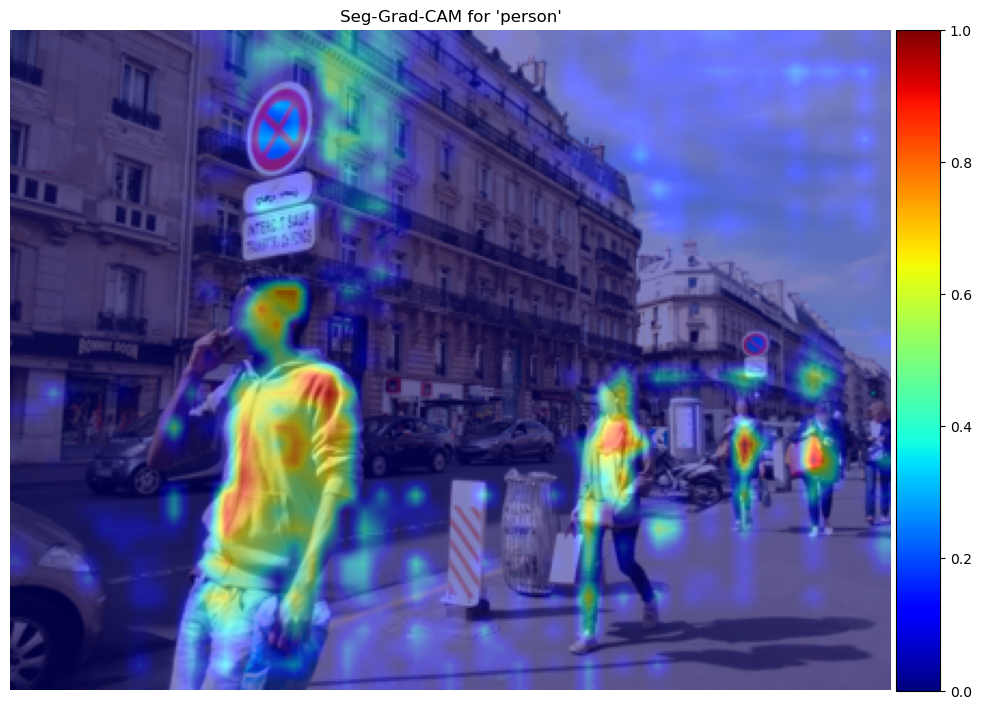

In [27]:
# Ensure the input image is a NumPy array for visualization
image_np = np.array(image)

# Resize the computed CAM to match the spatial dimensions of the input image
cam_resized = cv2.resize(cam, (image_np.shape[1], image_np.shape[0]))

# Plot the image with the CAM overlay
fig, ax = plt.subplots(figsize=(12, 12))
ax.imshow(image_np)  # Original image
heatmap = ax.imshow(cam_resized, cmap='jet', alpha=0.5)
ax.set_title("Seg-Grad-CAM for 'person'")
ax.axis("off")  # Hide axis labels

# Add colorbar with fixed scale (0.0 to 1.0)
norm = plt.Normalize(vmin=0.0, vmax=1.0)
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
sm = ScalarMappable(cmap='jet', norm=norm)
sm.set_array([])
plt.colorbar(sm, cax=cax)

# Show the final plot
plt.show()

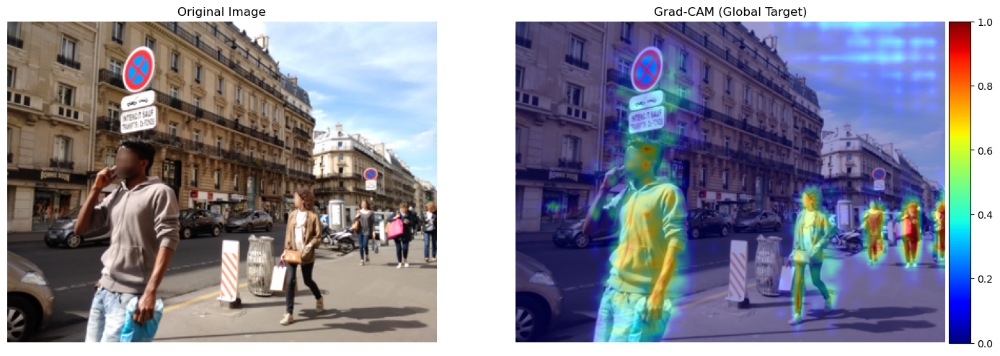

In [28]:
# Resize CAM to match the input image size
cam_resized = cv2.resize(grayscale_cam_global, (image_np.shape[1], image_np.shape[0]))  # (H, W)

# Generate a 3-channel color heatmap
heatmap_color = cv2.applyColorMap(np.uint8(255 * cam_resized), cv2.COLORMAP_JET)
heatmap_color = cv2.cvtColor(heatmap_color, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB

# Convert image to uint8 format for OpenCV compatibility
image_uint8 = (image_np * 255).astype(np.uint8) if image_np.max() <= 1.0 else image_np

# Create an overlay of the heatmap and the original image
overlay = cv2.addWeighted(image_uint8, 0.6, heatmap_color, 0.4, 0)

# Plot the original image and the Grad-CAM overlay side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# Display original image
ax1.imshow(image_uint8)
ax1.set_title("Original Image")
ax1.axis("off")

# Display Grad-CAM overlay
im = ax2.imshow(overlay)
ax2.set_title("Grad-CAM (Global Target)")
ax2.axis("off")

# Add colorbar for the CAM heatmap (scale 0.0 to 1.0)
norm = plt.Normalize(vmin=0.0, vmax=1.0)
divider = make_axes_locatable(ax2)
cax = divider.append_axes("right", size="5%", pad=0.05)
sm = ScalarMappable(cmap=plt.cm.jet, norm=norm)
sm.set_array([])
plt.colorbar(sm, cax=cax)

plt.tight_layout()
plt.show()


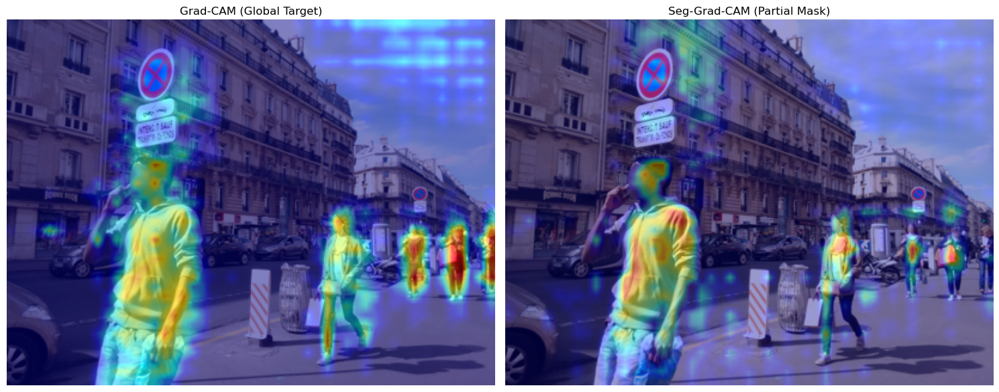

In [29]:
# Resize the CAM to match the input image dimensions
cam_resized = cv2.resize(cam, (image_np.shape[1], image_np.shape[0]))

# Convert the grayscale CAM to a colored heatmap using the JET colormap
heatmap_color = cv2.applyColorMap(np.uint8(255 * cam_resized), cv2.COLORMAP_JET)
heatmap_color = cv2.cvtColor(heatmap_color, cv2.COLOR_BGR2RGB)  # Convert from BGR (OpenCV default) to RGB

# Convert the input image to uint8 format if it was normalized (i.e., in range [0, 1])
image_uint8 = (image_np * 255).astype(np.uint8) if image_np.max() <= 1.0 else image_np

# Overlay the original image with the heatmap (60% image + 40% heatmap)
cam_img_masked = cv2.addWeighted(image_uint8, 0.6, heatmap_color, 0.4, 0)

# Plot both the classic and masked Grad-CAM results side by side
fig, axs = plt.subplots(1, 2, figsize=(15, 6))

# Show the classic Grad-CAM result (global class-level explanation)
axs[0].imshow(cam_img_global)
axs[0].set_title("Grad-CAM (Global Target)")
axs[0].axis("off")

# Show the Seg-Grad-CAM result (focused on the masked region)
axs[1].imshow(cam_img_masked)
axs[1].set_title("Seg-Grad-CAM (Partial Mask)")
axs[1].axis("off")

# Optimize layout for better visual alignment
plt.tight_layout()
plt.show()

In this case, both the custom Seg-Grad-CAM implementation and the GradCAM API fundamentally rely on the same mechanism: they compute gradients of a target output with respect to feature maps of a selected convolutional layer (usually the last one), weight the activations using globally averaged gradients, apply ReLU, and upsample the result to generate a heatmap.
However, the key technical difference lies in the target definition and control:
- In the GradCAM API, the target is usually a class score (e.g. for "person") across the whole image, and it abstracts away the backward pass, hooks, and CAM computation.
- In the Seg-Grad-CAM implementation, we're explicitly defining the target as a specific pixel or mask region in the segmentation output (e.g., "Why is this pixel labeled as person?"), giving us finer control over what the gradients are computed from — crucial for semantic segmentation.

#### Observation: Classic Grad-CAM vs. Seg-Grad-CAM (Partial Mask)
##### Classic Grad-CAM (left)
The attention is distributed across multiple persons throughout the scene, with notable strong activations on distant individuals further back in the image.
The heatmap reflects a broad, class-driven activation pattern: the general presence of "person" is detected across the scene without clear instance-level separation.
Some background regions also show weak activation, likely due to contextual associations.
In summary, classic Grad-CAM answers the question: "Why does the model detect the class 'person' somewhere in the image?"

##### Seg-Grad-CAM (right, with partial mask)
Here, the activation is tightly localized to the masked person in the foreground.
Strong activations are concentrated on the shoulder and upper torso areas, reflecting the model's focus on discriminative features for classifying this specific instance.
Other persons and background elements receive minimal to no attention, confirming that Seg-Grad-CAM produces an instance-specific explanation: "Why is this specific region classified as 'person'?"

## Saliency (Vanilla Gradient)

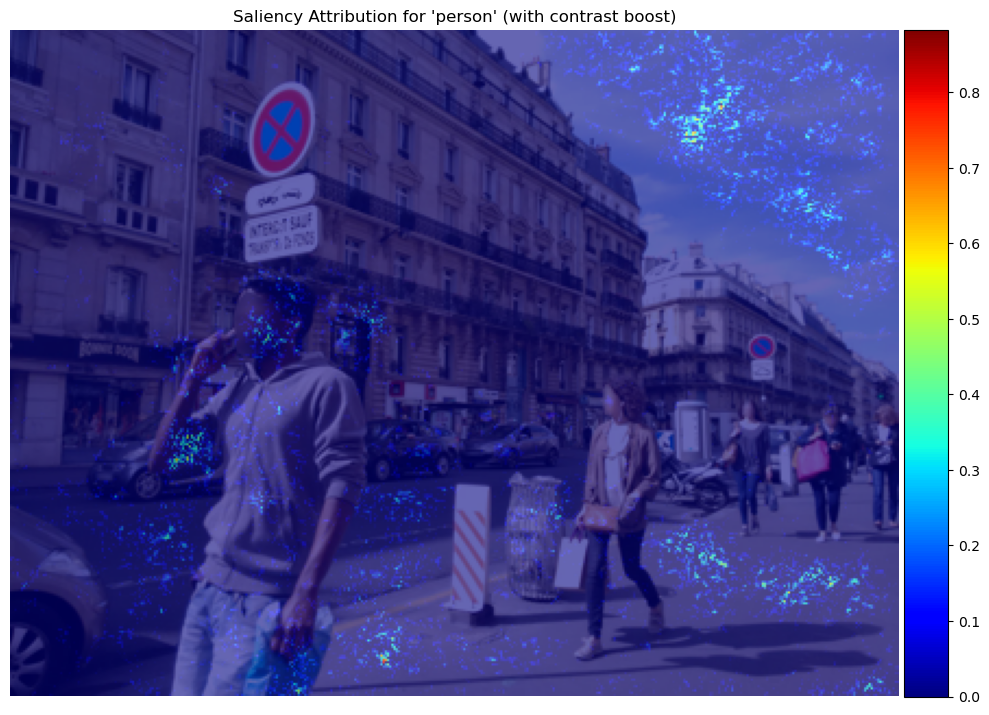

In [30]:
# Initialize Captum's Saliency method with a custom wrapper that focuses on the predicted class region
saliency = Saliency(agg_segmentation_wrapper)

# Enable gradient tracking on the input for attribution computation
input_tensor.requires_grad = True

# Compute saliency attributions for the specified class
sy_attr = saliency.attribute(input_tensor, target=person_class_id)

# Normalize saliency values to [0, 1] range for visualization
sy_attr_norm = (sy_attr - sy_attr.min()) / (sy_attr.max() - sy_attr.min())
sy_attr_float = sy_attr_norm.detach().cpu().numpy().astype(np.float32)
sy_heatmap = sy_attr_float[0, 0]  # Extract the first channel (since saliency is single-channel)
sy_heatmap_resized = cv2.resize(sy_heatmap, (input_tensor.shape[3], input_tensor.shape[2]))

# Enhance contrast: suppress low activations and apply gamma correction
threshold = 0.05  # Minimum visibility threshold
gamma = 0.8       # Gamma < 1 increases local contrast

sy_clipped = np.clip(sy_heatmap_resized, threshold, 1.0)  # Zero out weak responses
sy_clipped = (sy_clipped - threshold) / (1.0 - threshold)  # Re-normalize to [0, 1]
sy_boosted = np.power(sy_clipped, gamma)  # Gamma correction for better visual impact

# Reverse normalization (ImageNet stats) to obtain RGB input image for display
input_image_np = np.transpose(input_tensor[0].detach().cpu().numpy(), (1, 2, 0))
input_image_np = (input_image_np * np.array([0.229, 0.224, 0.225]) + 
                  np.array([0.485, 0.456, 0.406]))
input_image_np = np.clip(input_image_np, 0, 1)

# Overlay the enhanced saliency map on the input image
saliency_img = show_cam_on_image(input_image_np, sy_boosted, use_rgb=True, image_weight=0.4)

# Display the final visualization
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.imshow(saliency_img)
ax.set_title("Saliency Attribution for 'person' (with contrast boost)")
ax.axis("off")

# Add a colorbar to indicate attribution strength
norm = Normalize(vmin=sy_boosted.min(), vmax=sy_boosted.max())
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
sm = ScalarMappable(cmap=plt.cm.jet, norm=norm)
sm.set_array([])
plt.colorbar(sm, cax=cax)

plt.tight_layout()
plt.show()

#### Observation Saliency (Vanilla Gradient)

The saliency attribution for the class "person" shows sparse and scattered relevance patterns, similar to the "car" case.
Small localized activations are visible around edges and textures of nearby persons, but there is no strong, coherent focus on the full body structures.
Notably, distant persons and background elements are almost completely ignored, indicating very limited spatial sensitivity in the saliency explanation.

Overall, the Saliency method provides only fragmented and low-precision interpretability for the "person" class in this example.
Compared to Grad-CAM or LIME, the explanation lacks clear object-focused attribution and fails to capture the shape or continuity of person instances.

## XRAI 

In [31]:
# Convert the input tensor to a NumPy array (required format for the XRAI saliency method)
image_xrai = input_tensor.detach().cpu().numpy()
image_xrai = np.transpose(image_xrai[0], (1, 2, 0))  # Change shape from [C, H, W] to [H, W, 3]

# Reverse ImageNet normalization to recover original pixel values and convert to uint8
image_xrai = (image_xrai * np.array([0.229, 0.224, 0.225]) + 
              np.array([0.485, 0.456, 0.406]))  # Unnormalize
image_xrai = np.clip(image_xrai * 255, 0, 255).astype(np.uint8)  # Scale to [0, 255] and convert to uint8

In [32]:
def call_model_function(images, call_model_args=None, expected_keys=None):
    """
    Wrapper function for generating input gradients, compatible with XRAI saliency methods.
    Designed for segmentation models (e.g., DeepLabV3).
    """

    # Rescale input images from [0, 255] to [0, 1]
    images = images / 255.0
    
    # Convert images from [B, H, W, C] to [B, C, H, W] for PyTorch
    images = np.transpose(images, (0, 3, 1, 2))
    images = torch.tensor(images, dtype=torch.float32).to(device)

    # Apply standard ImageNet normalization to all images
    norm = transforms.Normalize([0.485, 0.456, 0.406],
                                [0.229, 0.224, 0.225])
    images = torch.stack([norm(img) for img in images])

    # Enable gradient tracking on the input images
    images.requires_grad = True

    # Compute aggregated class score for the specified target class
    scores = agg_segmentation_wrapper(images)[:, call_model_args["class"]]

    # Compute input gradients via backpropagation
    gradients = torch.autograd.grad(outputs=scores.sum(), inputs=images)[0]

    # Convert gradients to NumPy and reorder to [B, H, W, C] for XRAI
    gradients = gradients.detach().cpu().numpy()
    gradients = np.transpose(gradients, (0, 2, 3, 1))

    return {INPUT_OUTPUT_GRADIENTS: gradients}

The call_model_function acts as a bridge between the XRAI saliency framework and PyTorch-based segmentation models.
It standardizes image preprocessing, ensures gradient tracking, computes input-output gradients manually, and returns them in a format expected by XRAI.
Without this wrapper, gradient-based attribution methods such as XRAI would be incompatible with PyTorch workflows.

In [33]:
# Initialize XRAI attribution method
xrai = XRAI()

# Compute XRAI attribution mask for the target class 'person'
attribution = xrai.GetMask(
    image_xrai,                 # Input image (uint8, [H, W, 3])
    call_model_function,        # Model wrapper function for input gradients
    call_model_args={"class": person_class_id},  # Target class ID
    batch_size=20,              # Batch size for gradient computation
    baselines=None              # None = default
)

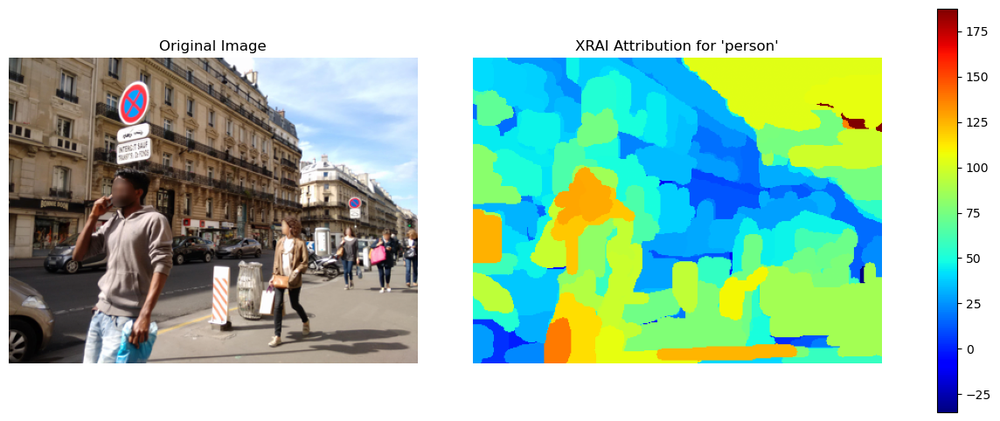

In [34]:
plt.figure(figsize=(14, 6))  # Set overall figure size (side-by-side layout)

# Create a grid with 3 columns: [image | heatmap | colorbar]
gs = gridspec.GridSpec(1, 3, width_ratios=[1, 1, 0.05], wspace=0.2)

# Show the original input image
ax0 = plt.subplot(gs[0])
ax0.imshow(image_xrai)
ax0.axis("off")
ax0.set_title("Original Image")

# Show the XRAI attribution heatmap
ax1 = plt.subplot(gs[1])
heatmap = ax1.imshow(attribution, cmap="jet")
ax1.axis("off")
ax1.set_title("XRAI Attribution for 'person'")

# Add colorbar aligned to the height of the heatmap
ax2 = plt.subplot(gs[2])
plt.colorbar(heatmap, cax=ax2)

plt.tight_layout()
plt.show()

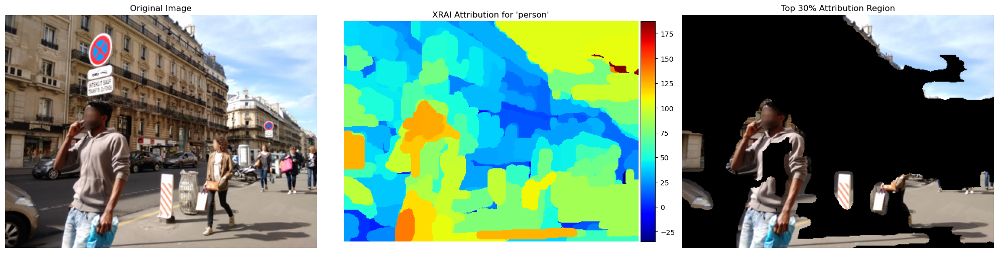

In [35]:
# Compute threshold corresponding to the top 30% of attribution values
threshold = np.percentile(attribution, 70)

# Create a binary mask that highlights only the most relevant regions (top 30%)
mask = attribution >= threshold

# Mask the original image: keep only top regions, set all others to black
image_top30 = image_xrai.copy()
image_top30[~mask] = 0

# Create a 3-panel visualization: original, full attribution, and top attribution region
fig, axs = plt.subplots(1, 3, figsize=(20, 8))

# Show the original RGB image
axs[0].imshow(image_xrai)
axs[0].set_title("Original Image")
axs[0].axis("off")

# Show the full XRAI attribution map
heatmap = axs[1].imshow(attribution, cmap="jet")
axs[1].set_title("XRAI Attribution for 'person'")
axs[1].axis("off")

# Show only the top 30% most relevant regions on the image
axs[2].imshow(image_top30)
axs[2].set_title("Top 30% Attribution Region")
axs[2].axis("off")

# Add colorbar for the attribution heatmap
norm = Normalize(vmin=attribution.min(), vmax=attribution.max())
divider = make_axes_locatable(axs[1])
cax = divider.append_axes("right", size="5%", pad=0.05)
sm = ScalarMappable(cmap="jet", norm=norm)
sm.set_array([])
plt.colorbar(sm, cax=cax)

plt.tight_layout()
plt.show()

#### Observation XRAI

he XRAI attribution for the class "person" shows a significant improvement in spatial coherence compared to raw saliency methods.
High attribution regions are largely concentrated on the foreground person, especially around the head, torso, and carrying hand, as shown by the top 30% attribution mask.

Although some low-level attribution leakage into background structures persists, the segmentation is considerably more object-focused.
Distant persons in the background receive little attention, emphasizing XRAI’s focus on the most salient and central instance.

Overall, XRAI provides a more interpretable and spatially meaningful explanation for the "person" class, but with slight over-aggregation toward adjacent context.

## L-CRP

#### Justification for Not Using L-CRP

Although L-CRP (Local Concept Relevance Propagation) is a powerful technique for generating concept-based explanations in segmentation and object detection models, it was not utilized in this thesis. This decision was based on several technical and methodological considerations:

1. Dataset and Model Dependencies
L-CRP is tightly coupled with specific datasets (e.g., VOC2012, Cityscapes) and custom-adapted model architectures. Integrating individual or custom samples requires restructuring the dataset pipeline and retraining or reformatting models accordingly.

2. Reproducibility and System Stability
Reproducing L-CRP's explanations requires the generation of concept reference spaces and glocal analysis steps, which are non-trivial to adapt for non-standard inputs. Ensuring consistency and comparability across experiments would demand extensive validation effort.

3. Scope of the Thesis and Methodological Focus
The primary aim of this thesis is to evaluate and compare input-level attribution methods (e.g., Grad-CAM, Saliency, Integrated Gradients) in the context of semantic segmentation. These methods integrate seamlessly with individual image samples and standard pretrained models.

## Integrated Gradients (IG)

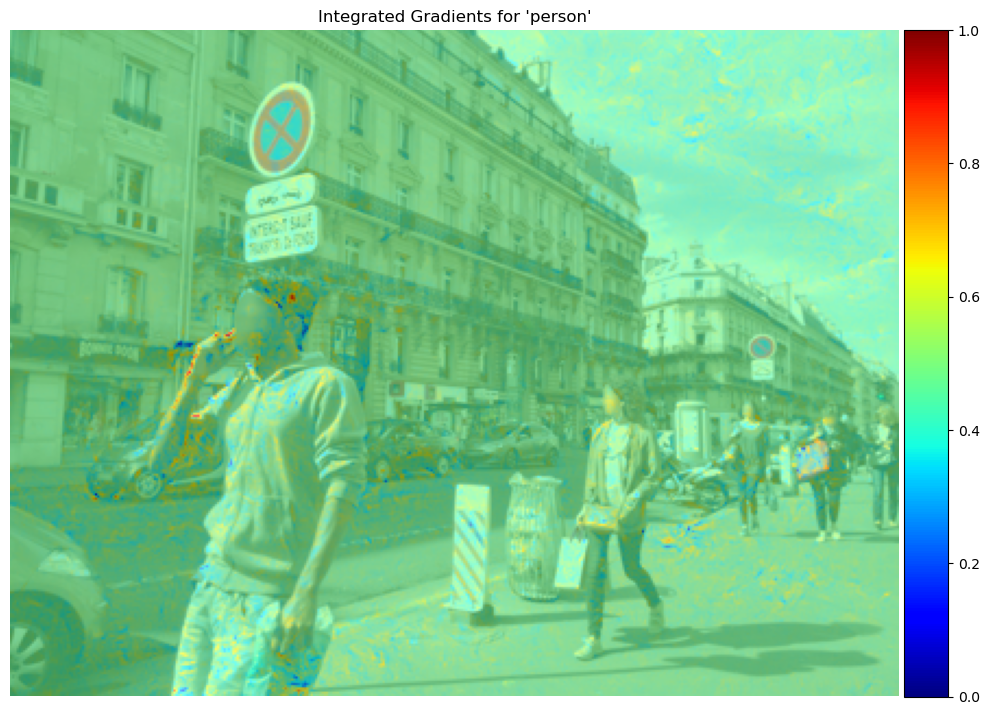

In [36]:
# Initialize Integrated Gradients with region-based segmentation aggregation
ig = IntegratedGradients(agg_segmentation_wrapper)

# Define a black image as baseline and specify the target class ID ('person')
baselines = torch.zeros_like(input_tensor)

# Compute IG attributions for the target class using path integral approximation
ig_attr = ig.attribute(
    input_tensor,
    target=person_class_id,
    baselines=baselines,
    n_steps=10,                # Number of steps along the interpolation path
    internal_batch_size=1      # Reduce memory usage for large images
)

# Normalize attribution values to [0, 1] for visualization
ig_attr_norm = (ig_attr - ig_attr.min()) / (ig_attr.max() - ig_attr.min())
ig_attr_float = ig_attr_norm.detach().cpu().numpy().astype(np.float32)
ig_heatmap = ig_attr_float[0, 0]  # Extract single-channel heatmap
ig_heatmap_resized = cv2.resize(ig_heatmap, (input_tensor.shape[3], input_tensor.shape[2]))

# Apply optional contrast enhancement (thresholding + gamma correction)
threshold = 0.05  # Mask out low-importance regions
gamma = 0.8       # Boost mid-range contrast
ig_clipped = np.clip(ig_heatmap_resized, threshold, 1.0)
ig_clipped = (ig_clipped - threshold) / (1.0 - threshold)
ig_boosted = np.power(ig_clipped, gamma)

# Reverse normalization to obtain the original RGB image for overlay
input_image_np = np.transpose(input_tensor[0].detach().cpu().numpy(), (1, 2, 0))
input_image_np = (input_image_np * np.array([0.229, 0.224, 0.225]) + 
                  np.array([0.485, 0.456, 0.406]))
input_image_np = np.clip(input_image_np, 0, 1)

# Generate overlay of IG heatmap on the original image
ig_img = show_cam_on_image(input_image_np, ig_boosted, use_rgb=True, image_weight=0.4)

# Plot the result with attribution overlay and colorbar
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.imshow(ig_img)
ax.set_title("Integrated Gradients for 'person'")
ax.axis("off")

# Add colorbar showing attribution strength [0.0, 1.0]
norm = Normalize(vmin=0.0, vmax=1.0)
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
sm = ScalarMappable(cmap=plt.cm.jet, norm=norm)
sm.set_array([])
plt.colorbar(sm, cax=cax)

plt.tight_layout()
plt.show()

To improve visualization, the attribution map was normalized and enhanced using thresholding and gamma correction. 

With Integrated Gradients, the results are not very clear - even with correction. The following code will only consider the attributions without the background image.

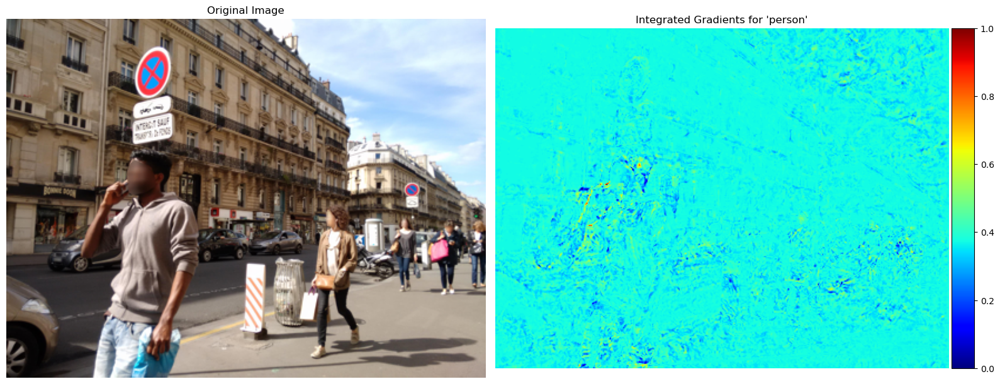

In [37]:
fig, axs = plt.subplots(1, 2, figsize=(16, 8))  # Set up a 1x2 grid for side-by-side comparison

# Display the original input image
axs[0].imshow(input_image_np)
axs[0].set_title("Original Image")
axs[0].axis("off")

# Display the Integrated Gradients heatmap without overlay
heatmap = axs[1].imshow(ig_boosted, cmap="jet")
axs[1].set_title("Integrated Gradients for 'person'")
axs[1].axis("off")

# Add colorbar next to the heatmap to indicate attribution intensity
norm = Normalize(vmin=0.0, vmax=1.0)
divider = make_axes_locatable(axs[1])
cax = divider.append_axes("right", size="5%", pad=0.05)
sm = ScalarMappable(cmap=plt.cm.jet, norm=norm)
sm.set_array([])

plt.colorbar(sm, cax=cax)  # Attach the colorbar to the right of the second plot

plt.tight_layout()
plt.show()

#### Observation Integrated Gradients (IG)

To improve clarity, this visualization removes the background image and displays only the pure attribution heatmap.
This enables a more direct interpretation of the Integrated Gradients result by isolating the relevant signal without visual distraction from the input image.

The resulting heatmap shows that the attributions for the class "person" are still weak and fragmented, but notably stronger than those observed for the "car" class in the first notebook.
Slightly higher relevance appears around local structures — mainly at the head, torso, and arms of nearby persons — whereas background areas remain largely noisy and incoherent.
Attribution signals, although sparse, are more meaningfully aligned with person contours compared to the scattered responses seen in the "car" attribution.

Overall, while Integrated Gradients still struggles to deliver fully coherent or class-specific explanations for "person," it provides noticeably stronger and more spatially relevant signals than in the "car" case.
Nevertheless, IG remains less precise than methods like Grad-CAM, LIME, or XRAI.

# Part 3 - Metrics

Next, using Quantus, various metrics will be applied to the methods in order to evaluate and determine the best one.

To evaluate how well attribution heatmaps highlight relevant regions in an image, we use specific batch inputs that describe the image, the model’s focus, the ground truth, and the target class:

- x_batch – The input image shown to the model. (e.g., an image of a person on the street)
- dummy_x_batch – Placeholder input (only needed for some metrics like Pointing Game) (e.g., a blank image filled with zeros)
- a_batch – The attribution (heatmap) showing which pixels the model found important. (e.g., the heatmap highlights the person's wheels and headlights)
- s_batch – Ground truth mask showing where the actual object is. (e.g., a binary mask marking the entire person body)
- y_batch – The target class to evaluate (either as ID or one-hot vector). (e.g., class ID [15] for "person")

In [38]:
# Install Quantus – library for evaluating explainability methods
!pip install quantus

# Install cachetools – required dependency for Quantus caching
!pip install cachetools

# Import Quantus for explainability evaluation (e.g., MaxSensitivity, Faithfulness)
import quantus

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


In [39]:
# Import the helper function to list metric categories available in Quantus
from quantus.helpers.constants import available_categories

# Display the supported metric categories (e.g., Robustness, Faithfulness, etc.)
available_categories()

['Faithfulness',
 'Robustness',
 'Localisation',
 'Complexity',
 'Randomisation',
 'Axiomatic']

In [40]:
# Import utility function to list all metric names available in Quantus
from quantus.helpers.constants import available_metrics

# Display the full list of supported evaluation metrics for XAI methods
available_metrics()

{'Faithfulness': ['Faithfulness Correlation',
  'Faithfulness Estimate',
  'Pixel-Flipping',
  'Region Segmentation',
  'Monotonicity-Arya',
  'Monotonicity-Nguyen',
  'Selectivity',
  'SensitivityN',
  'IROF',
  'ROAD',
  'Infidelity',
  'Sufficiency'],
 'Robustness': ['Continuity Test',
  'Local Lipschitz Estimate',
  'Max-Sensitivity',
  'Avg-Sensitivity',
  'Consistency',
  'Relative Input Stability',
  'Relative Output Stability',
  'Relative Representation Stability'],
 'Localisation': ['Pointing Game',
  'Top-K Intersection',
  'Relevance Mass Accuracy',
  'Relevance Rank Accuracy',
  'Attribution Localisation ',
  'AUC',
  'Focus'],
 'Complexity': ['Sparseness', 'Complexity', 'Effective Complexity'],
 'Randomisation': ['MPRT', 'Smooth MPRT', 'Efficient MPRT', 'Random Logit'],
 'Axiomatic': ['Completeness', 'NonSensitivity', 'InputInvariance']}

In [41]:
# Import chosen metrics
from quantus import MaxSensitivity, PointingGame, Focus, EffectiveComplexity, IROF

In [42]:
# Import perturbation function – used to apply controlled input modifications (e.g., occlusion, noise)
from quantus.functions import perturb_func

# Import additional utility functions:
# - norm_func: for normalization of attribution maps or scores
# - perturb_func: for generating perturbed input samples (e.g., patch masking)
# - similarity_func: for comparing original and perturbed outputs or attributions

from quantus import norm_func, perturb_func, similarity_func

In explainability pipelines, it's common practice to run attribution methods such as LIME, Grad-CAM, or XRAI on the GPU, as they are computationally intensive.
However, the Quantus library performs its evaluation metrics (e.g., IROF, Focus, MaxSensitivity) on the CPU only. Therefore, the model must be explicitly moved to the CPU before applying Quantus-based evaluations.
This CPU-GPU switch is standard in many XAI workflows and ensures compatibility with Quantus' internal processing.

In [43]:
# Move model to CPU (required for Quantus evaluation)
model_cpu = model.to("cpu")

## IROF

In [44]:
# Convert LIME attribution to NumPy and remove extra batch dimension
a_batch_lime = lime_attr.detach().cpu().numpy().squeeze()

In [45]:
class FastIROF:
    def __init__(self, model, device, scale=20, sigma=0.5, min_size=10, max_regions=50):
        # Initialize IROF evaluator with model and segmentation parameters
        self.model = model.to(device)
        self.device = device
        self.scale = scale  # Felzenszwalb: scale parameter controls segment size
        self.sigma = sigma  # Gaussian smoothing parameter
        self.min_size = min_size  # Minimum size for a region
        self.max_regions = max_regions  # Max number of regions to evaluate

    def perturb(self, image, mask):
        # Replace selected region in the image with the image’s average color (baseline)
        baseline = image.mean(dim=[2, 3], keepdim=True)
        image = image.clone()

        if mask.shape != (image.shape[2], image.shape[3]):
            raise ValueError(f"Mask shape {mask.shape} does not match image shape {(image.shape[2], image.shape[3])}")

        mask = mask.unsqueeze(0).unsqueeze(0)  # Add batch and channel dims
        mask = mask.expand_as(image)  # Match shape to image

        # Apply perturbation: replace masked area with baseline
        image = torch.where(mask.bool(), baseline, image)
        return image

    def apply(self, x, a, y, batch_size=8):
        # Apply the FastIROF evaluation method
        x = x.to(self.device)
        y = y.to(self.device)

        print("x shape:", x.shape)

        a = a.squeeze()
        if a.ndim == 3:
            a = a.mean(axis=0)  # Collapse across channels if needed

        print("Attribution shape before felzenszwalb:", a.shape)

        if a.shape != (x.shape[2], x.shape[3]):
            raise ValueError(f"Attribution shape {a.shape} does not match image size {(x.shape[2], x.shape[3])}")

        # Get original model score for the target class
        with torch.no_grad():
            output = self.model(x)
            orig_score = F.softmax(output, dim=1) * y  # Element-wise multiplication with target mask
            orig_score = orig_score.sum().item()

        # Segment the attribution map using Felzenszwalb algorithm
        segments = felzenszwalb(a, scale=self.scale, sigma=self.sigma, min_size=self.min_size)
        print("Number of detected regions:", len(np.unique(segments)))

        # Compute average attribution score for each region
        region_scores = [(seg_id, a[segments == seg_id].mean()) for seg_id in np.unique(segments)]
        np.random.seed(42)
        np.random.shuffle(region_scores)

        # Optionally limit number of evaluated regions
        if len(region_scores) > self.max_regions:
            region_scores = region_scores[:self.max_regions]

        scores = [orig_score]
        perturbed_images = []

        # Create perturbed versions of the image by masking out one region at a time
        for seg_id, _ in region_scores:
            mask = (segments == seg_id).astype(np.uint8)
            mask_tensor = torch.from_numpy(mask).to(self.device)
            perturbed_images.append(self.perturb(x.clone(), mask_tensor))

        # Stack all perturbed images into one batch
        perturbed_images = torch.stack(perturbed_images).squeeze(1)  # Shape: [num_regions, C, H, W]

        # Run model on all perturbed images and collect scores
        with torch.no_grad():
            for i in range(0, len(perturbed_images), batch_size):
                batch = perturbed_images[i:i+batch_size]
                output = self.model(batch)
                for out in output:
                    score = F.softmax(out, dim=0) * y.squeeze()
                    scores.append(score.sum().item())

        return scores, segments

# Plot segmentation overlay on original image with custom method name
def plot_segments(image_np, segments, name=""):
    plt.figure(figsize=(8, 6))
    plt.imshow(image_np[:segments.shape[0], :segments.shape[1]])  # Show original image
    plt.imshow(segments, cmap="jet", alpha=0.4)  # Overlay superpixels
    plt.title(f"Felzenszwalb Superpixel Overlay (IROF for {name})")
    plt.axis("off")
    plt.tight_layout()
    plt.show()

# Plot IROF score drop curve (sorted vs. random), legend placed safely
def plot_irof_scores(scores_sorted, scores_random, name=""):
    plt.figure(figsize=(7, 5))
    plt.plot(scores_sorted, marker="o", label="Sorted by Attribution", linewidth=2)
    plt.plot(scores_random, marker="x", linestyle='--', label="Random Order", linewidth=1.5)
    plt.title(f"IROF Score Drop Comparison ({name})")
    plt.xlabel("Number of Removed Regions")
    plt.ylabel("Model Output Score")
    plt.grid(True)

    # Legend placed outside upper right
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.12), ncol=2, frameon=False)
    plt.tight_layout()
    plt.show()

# Generate and visualize Grad-CAM for a specific target class
def generate_gradcam(model, target_layers, input_tensor, image_np, targets):
    with GradCAM(model=model, target_layers=target_layers) as cam:
        grayscale_cam = cam(input_tensor=input_tensor, targets=targets)[0]


--- IROF for LIME ---
x shape: torch.Size([1, 3, 306, 408])
Attribution shape before felzenszwalb: (306, 408)
Number of detected regions: 91


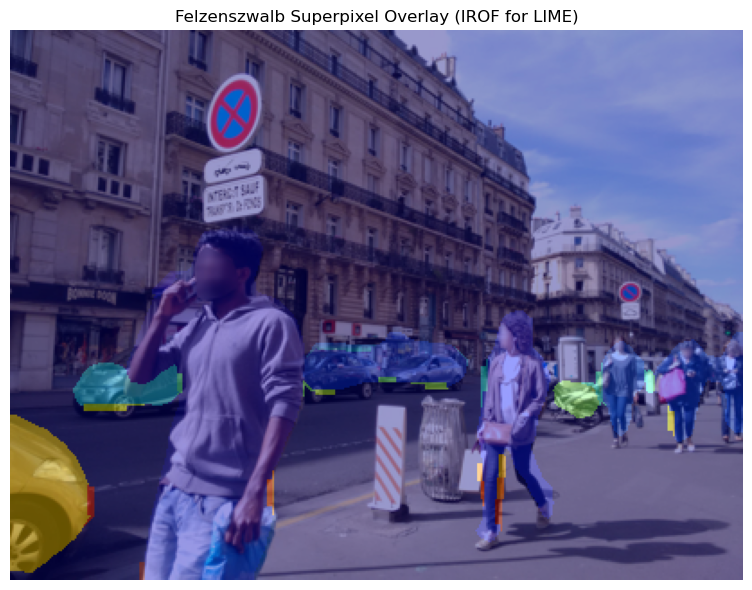

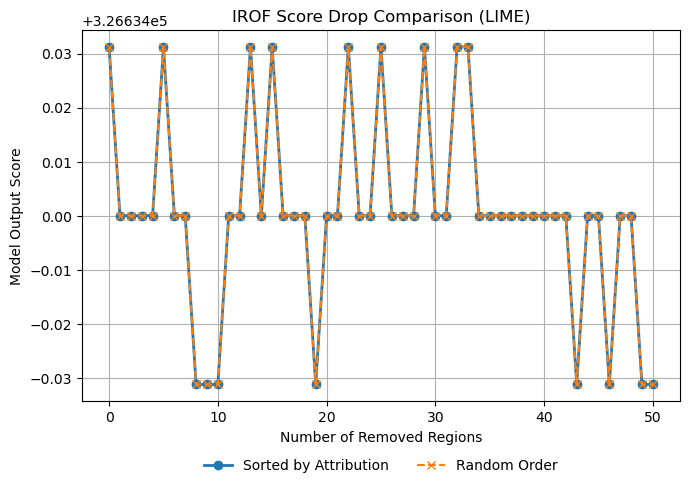

Number of detected regions: 91

--- IROF for GradCAM ---
x shape: torch.Size([1, 3, 306, 408])
Attribution shape before felzenszwalb: (306, 408)
Number of detected regions: 571


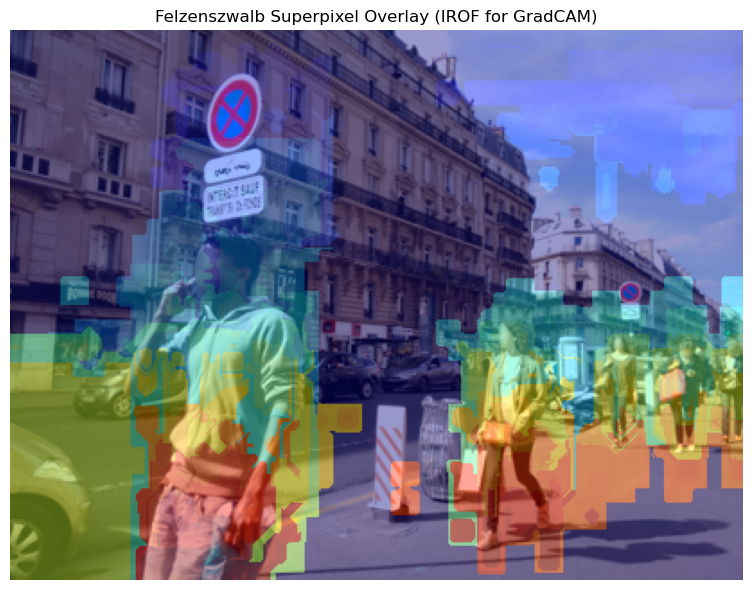

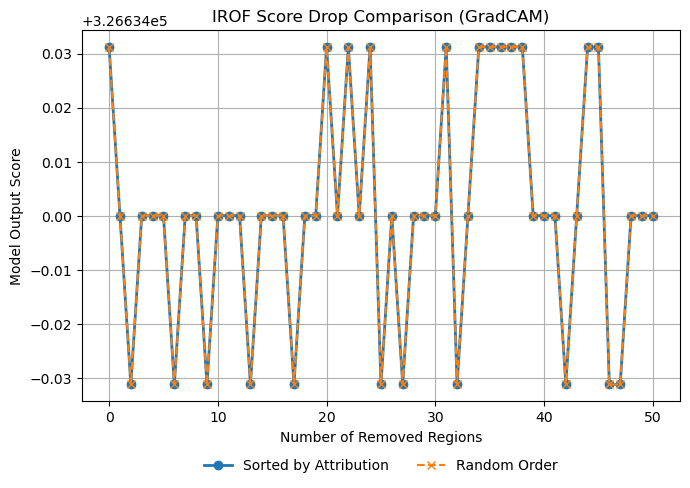

Number of detected regions: 571

--- IROF for Seg-GradCAM ---
x shape: torch.Size([1, 3, 306, 408])
Attribution shape before felzenszwalb: (306, 408)
Number of detected regions: 659


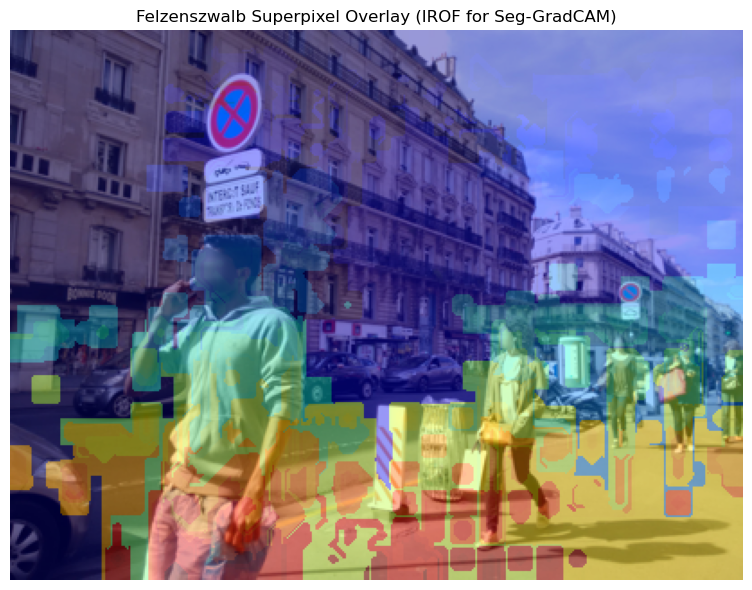

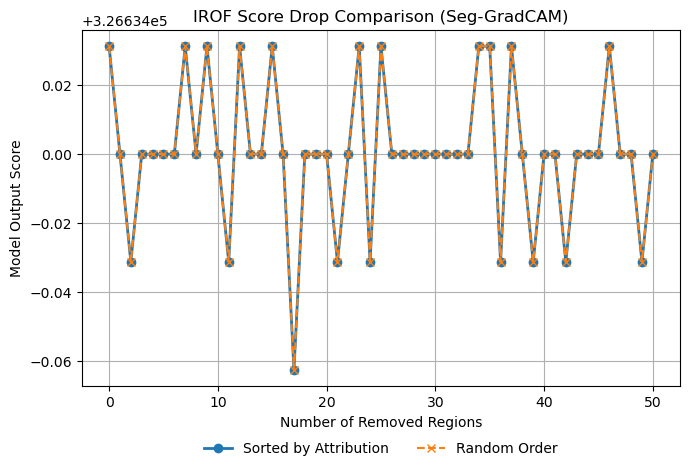

Number of detected regions: 659

--- IROF for Saliency ---
x shape: torch.Size([1, 3, 306, 408])
Attribution shape before felzenszwalb: (306, 408)
Number of detected regions: 802


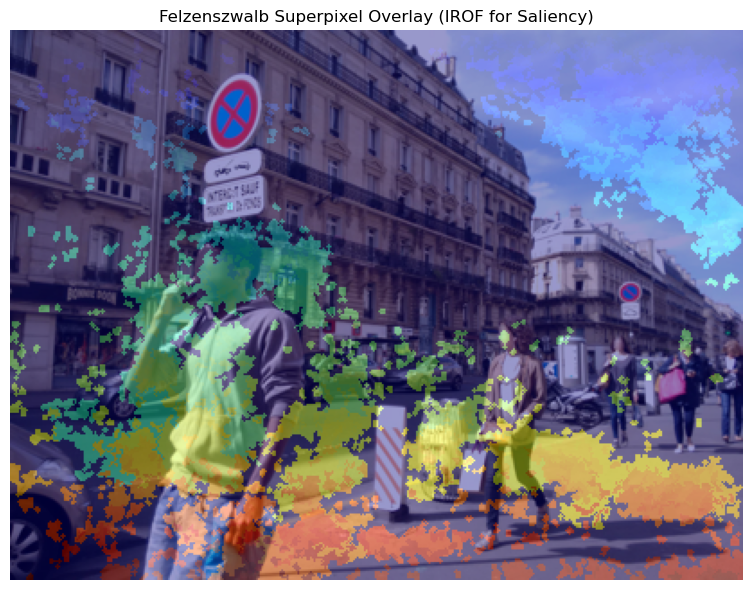

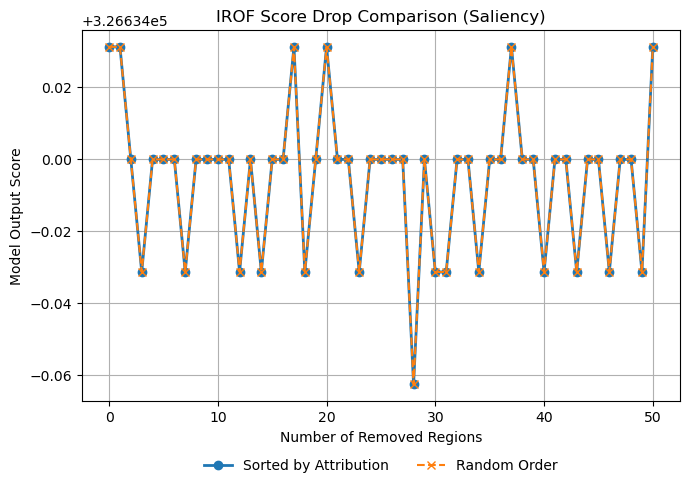

Number of detected regions: 802

--- IROF for XRAI ---
x shape: torch.Size([1, 3, 306, 408])
Attribution shape before felzenszwalb: (306, 408)
Number of detected regions: 812


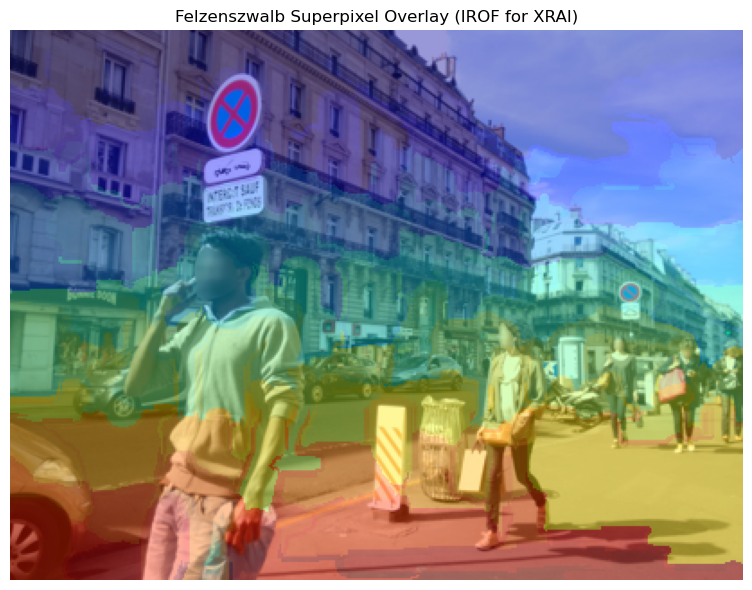

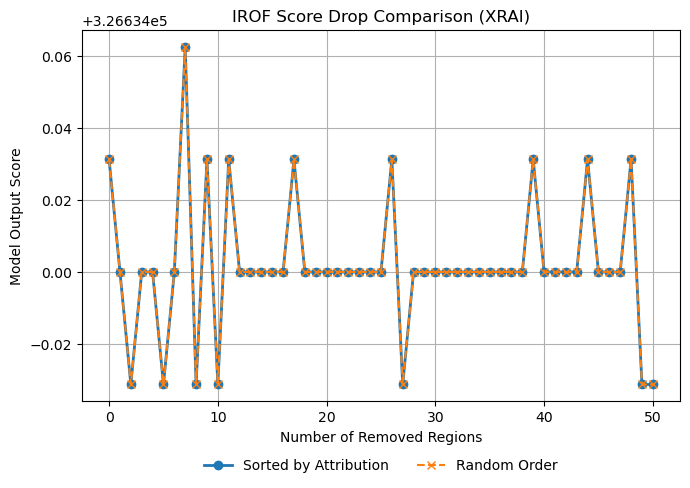

Number of detected regions: 812

--- IROF for IG ---
x shape: torch.Size([1, 3, 306, 408])
Attribution shape before felzenszwalb: (306, 408)
Number of detected regions: 979


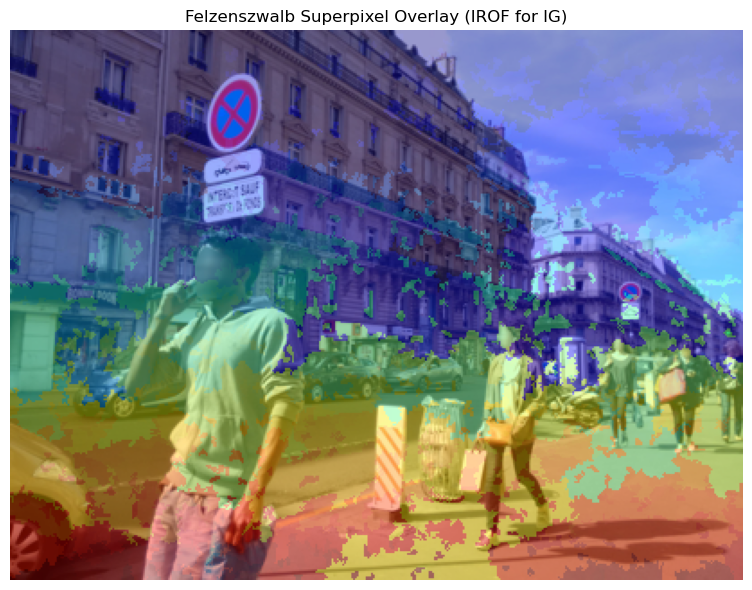

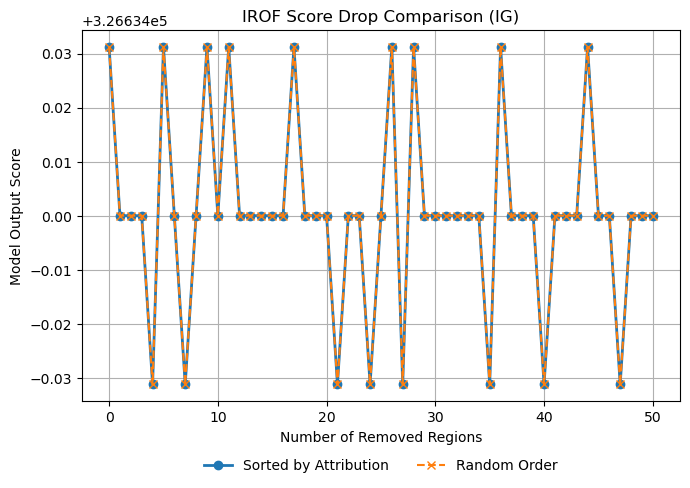

Number of detected regions: 979


In [46]:
# Initialize dictionaries to store IROF results and raw scores
irof_results = {}
scores_dict = {}

# Define the attribution methods and their corresponding attribution maps
methods = {
    "LIME": a_batch_lime,
    "GradCAM": grayscale_cam_global.squeeze(),
    "Seg-GradCAM": cam_resized.squeeze(),
    "Saliency": sy_boosted.squeeze(),
    "XRAI": attribution.squeeze(),
    "IG": ig_boosted.squeeze()
}

# Run IROF evaluation for all attribution methods
for name, attr in methods.items():
    print(f"\n--- IROF for {name} ---")

    # Instantiate FastIROF evaluator with segmentation-based masking
    irof = FastIROF(
        model=model_cpu,
        device="cpu",
        scale=20,
        sigma=0.5,
        min_size=10,
        max_regions=50
    )

    # Apply IROF: perturb regions and track score drops
    scores, segments = irof.apply(
        x=input_tensor,
        a=attr,
        y=out_max
    )

    # Store IROF results: score curve and number of segments
    irof_results[name] = {
        "scores": scores,
        "num_regions": len(np.unique(segments))
    }

    scores_dict[name] = scores

    # Optional: plot segmented image and score drop curve
    plot_segments(image_np=image_np, segments=segments, name=name)
    plot_irof_scores(scores_sorted=scores, scores_random=scores, name=name)


    print("Number of detected regions:", len(np.unique(segments)))

#### Why max_regions=50?
Limiting to 50 regions ensures a good balance between spatial resolution and runtime efficiency. This number is sufficient to capture meaningful attribution patterns without over-segmenting the image or introducing noise from very small, low-relevance regions. At the same time, it limits the number of model evaluations during IROF scoring, keeping runtime manageable.

This choice follows common practice (e.g., Quantus toolkit) and has proven to be empirically stable and effective across a wide range of image sizes.

Although not statistically "optimal," it typically yields robust results across standard resolutions (e.g., 224×224 to 512×512). For higher-resolution inputs, slightly increasing the number (e.g., to 75–100) may be appropriate, while smaller inputs may require fewer regions (e.g., 30–40).

#### Interpretation of the IROF Score Curve
The displayed score curve illustrates how the model’s output score changes when important image regions are gradually masked. The regions are sorted based on their estimated importance according to the chosen attribution method and then removed step by step.

An ideal score curve would show a continuous and steady decline. This would indicate that the model strongly relies on these regions for its prediction. An unstable or fluctuating curve should not necessarily be interpreted as an error but rather as a possible indication of a robust model or a broadly distributed attribution.

In this case, the score curve shows an unusual pattern. Instead of decreasing steadily, the score goes up and down a lot. There are two possible reasons for this:

1. The model appears to be highly robust to the removal of individual regions and is able to extract relevant information from the remaining areas.

2. The selected attribution method (LIME) distributes importance relatively evenly across many regions, resulting in less focused and highly localized key areas.

To make sure everything works correctly during the IROF evaluation, we first check that the input image and the predicted class map have the expected shapes:

In [47]:
# Confirm input and prediction shapes
print(input_tensor.shape)  # (1, 3, H, W) – input image tensor
print(out_max.shape)       # (1, H, W) – predicted class per pixel

torch.Size([1, 3, 306, 408])
torch.Size([1, 1, 306, 408])


In [48]:
# Create binary mask for the target class ('person' = class ID 1)
target_mask = (out_max == 1).float().unsqueeze(0)  # Shape: (1, 1, H, W)

The shapes show how the data was prepared correctly:

- The input image was stored as (1, 3, H, W) → meaning: 1 image, 3 color channels, height and width.

- The model output was saved as (1, H, W) → meaning: 1 image, with class prediction for every pixel.

- The target mask for class "person" was created from the output. All pixels with class 1 were marked with 1. It was expanded to shape (1, 1, H, W), so that it fits the input image for masking.

IROF was applied correctly, as all methodological steps were implemented appropriately. The input image was processed in its original dimensions, the target mask for class "person" was accurately derived from the model output and adapted to the input shape. Region perturbation was performed using a standard baseline replacement, and regions were removed sequentially according to their attribution scores, in line with the IROF procedure.

In [49]:
# Create a DataFrame to compare score curves across attribution methods
scores_df = pd.DataFrame(dict([(k, pd.Series(v)) for k, v in scores_dict.items()]))

# Create a summary DataFrame with score lists and number of segments per method
irof_df = pd.DataFrame({
    method: {
        "scores": res["scores"],
        "num_regions": res["num_regions"]
    } for method, res in irof_results.items()
}).T  # Transpose for clearer tabular structure

# Display summary and detailed scores
print(irof_df)       # Overview: number of regions and raw score lists
display(scores_df)   # Score curve data (step-by-step) for all methods

                                                        scores num_regions
LIME         [326634.03125, 326634.0, 326634.0, 326634.0, 3...          91
GradCAM      [326634.03125, 326634.0, 326633.96875, 326634....         571
Seg-GradCAM  [326634.03125, 326634.0, 326633.96875, 326634....         659
Saliency     [326634.03125, 326634.03125, 326634.0, 326633....         802
XRAI         [326634.03125, 326634.0, 326633.96875, 326634....         812
IG           [326634.03125, 326634.0, 326634.0, 326634.0, 3...         979


,LIME,GradCAM,Seg-GradCAM,Saliency,XRAI,IG
0,326634.03125,326634.03125,326634.03125,326634.03125,326634.03125,326634.03125
1,326634.00000,326634.00000,326634.00000,326634.03125,326634.00000,326634.00000
2,326634.00000,326633.96875,326633.96875,326634.00000,326633.96875,326634.00000
3,326634.00000,326634.00000,326634.00000,326633.96875,326634.00000,326634.00000
4,326634.00000,326634.00000,326634.00000,326634.00000,326634.00000,326633.96875
5,326634.03125,326634.00000,326634.00000,326634.00000,326633.96875,326634.03125
6,326634.00000,326633.96875,326634.00000,326634.00000,326634.00000,326634.00000
7,326634.00000,326634.00000,326634.03125,326633.96875,326634.06250,326633.96875
8,326633.96875,326634.00000,326634.00000,326634.00000,326633.96875,326634.00000
9,326633.96875,326633.96875,326634.03125,326634.00000,326634.03125,326634.03125


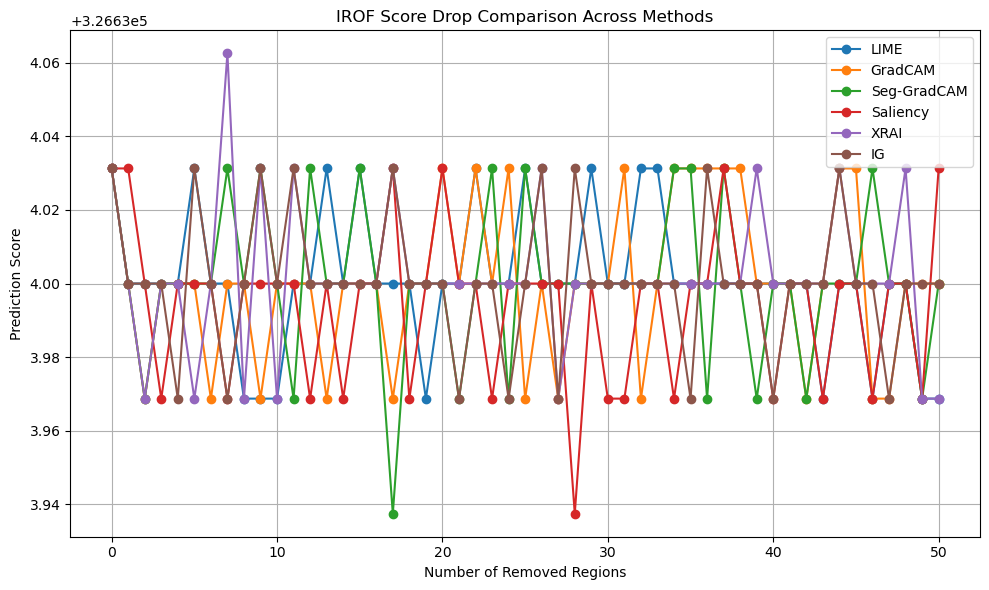

In [50]:
# Plot IROF score drop curves for all attribution methods
plt.figure(figsize=(10, 6))
for method, scores in scores_dict.items():
    plt.plot(scores, marker="o", label=method)

plt.title("IROF Score Drop Comparison Across Methods")
plt.xlabel("Number of Removed Regions")
plt.ylabel("Prediction Score")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Export the score curves to CSV for further analysis or reporting
scores_df.to_csv('irof_scores_vergleich.csv', index=False)

The score-drop curves for both attribution-based and randomly selected region removal are largely identical. This indicates that the specific order in which regions are masked has only a minor influence on the model’s output. Consequently, the different attribution methods seem to distribute importance relatively evenly across the entire image.

Additionally, the overall score exhibits considerable fluctuations without showing a clear or consistent pattern. This suggests that while the model reacts to the removal of certain regions, its sensitivity appears rather unsystematic. On average, the score remains at a stable level, which is characteristic for attribution maps that highlight large and widespread areas instead of very localized information.

##### How to interpret the overlay colors
The colors shown in the overlays (e.g., red = high importance, blue = low importance) do not necessarily indicate the exact object location (e.g., the person). Instead, these colors visualize:
"Where in the image does the model perceive relevant signals or features influencing its prediction?"

Such features can include:

- Structural elements (e.g., edges or contours)
- Colors
- Textures
- Contextual surroundings (e.g., road next to a person)

→ Importantly, the highlighted areas do not have to align precisely with the actual object boundaries!

##### How to interpret the IROF score plot
The IROF score plot is structured as follows:

- x-axis: Number of regions removed from the image
- y-axis: The corresponding change in the model’s softmax score for the target class (e.g., “person”)

The plot shows two lines:

🔵 Sorted by attribution – regions with the highest relevance are removed first
🟠 Random order – regions are removed in a random sequence, serving as a control condition

→ A clear and strong drop in the blue curve (sorted removal), in contrast to a stable orange curve (random removal), indicates that the attribution method successfully identifies regions that are truly important for the model’s prediction.

##### IROF for LIME
The person image was segmented into 91 superpixels due to its higher structural complexity, whereas the car image produced only 34 regions.
This reflects the richer detail and finer edge structures present in the person scene, leading to a denser region-wise evaluation in the IROF process.

##### IROF for GradCAM / Seg-GradCAM
Grad-CAM produces 571 superpixels, while Seg-Grad-CAM generates 659 regions.
This high count for Seg-Grad-CAM results from its finer, instance-specific activations, particularly along body contours and details such as shoulders or arms, which lead to many small segments.
Grad-CAM, in contrast, produces smoother, broader activations that cover larger, more cohesive regions — most notably the main person in the foreground.

Visually, Grad-CAM proves to be more precise in this example, as it clearly highlights the central person and spreads less into irrelevant background areas.
Seg-Grad-CAM, despite its instance-focused design, appears more fragmented and distributes activations less accurately, including over the ground or distant objects.
The stronger over-segmentation by Felzenszwalb amplifies this effect, as even small intensity variations lead to excessively fine-grained regions.

##### IROF for Saliency
For the class "person", Saliency leads to 802 superpixels.
This extremely high count is caused by Saliency’s inherently noisy and edge-sensitive attribution map.
Felzenszwalb interprets even slight pixel variations as region boundaries, resulting in an over-segmentation with many tiny, scattered superpixels.
This fragmentation makes the overlay appear highly disorganized. While certain areas on persons (e.g., torso or legs) receive some activation, these are broken into numerous small patches, with little spatial coherence.
Additionally, large portions of the background — especially the sky and pavement — are incorrectly segmented into highly saturated regions, further reducing attribution clarity.

##### IROF for XRAI
The horizontally elongated attribution region suggests that XRAI captures not just individual persons, but broader spatial zones where the class "person" is likely present. This reflects XRAI’s region-based nature and tendency to highlight semantically cohesive areas — even if they span beyond the actual object boundaries.

##### IROF for IG
Integrated Gradients (IG) produced 979 regions, the highest number of superpixels among all evaluated methods.
This is due to IG’s inherently fine-grained and gradient-sensitive nature: even minimal pixel changes result in attribution values, which the Felzenszwalb algorithm then segments into a large number of small patches.

The visual overlay appears extremely fragmented and noisy, with tiny attribution regions scattered across the entire image — including the sky, buildings, and road surfaces.
While some activations are visible on person-like areas (e.g., arms or torso), there is no coherent object structure — no single person is clearly delineated.

Interestingly, the IROF curve shows the strongest absolute score drop of all methods.
However, this does not indicate better attribution quality.
Instead, the drop likely results from the random overlap of many small regions with relevant pixels.
In other words, when hundreds of tiny areas are masked, it becomes statistically probable that some relevant information is removed —
not because the attribution map correctly identified important regions, but simply due to the sheer number of perturbations.
This reflects statistical noise rather than a meaningful signal.

##### Differences between the methods:

- No method exhibits a consistent, sharp score drop that would indicate strong functual impact.
- IG shows the largest drop, but fails to outperform random masking, due to excessive fragmentation.
- Grad-CAM and Seg-Grad-CAM produce visually convincing results, yet lack measurable influence.
- XRAI is more stable and semantically coherent, but its regions are too broad for precise interpretation.

##### What do these score differences mean?

The numbers (e.g., 25578.001953 → 25578.000000 → 25577.998047) represent the model’s softmax confidence for a target class (like "person"). They are very close to each other, differing only in small decimals.

Small score fluctuations are normal and often not meaningful alone. What matters is the overall pattern — consistent drop = good attribution, no change = irrelevant regions, random fluctuations = scattered or noisy attribution.

#####  Person vs. Car – Key Differences
- Person classification is harder to attribute, due to body pose, clothing, occlusion, and background context.
- Car segmentation works better with region-based methods (like LIME), since vehicles are rigid, distinct, and compact, making it easier to isolate relevant areas.
- For person, only Grad-CAM showed clearer visual focus — but this was not reflected in the IROF score drop, confirming a disconnect between visual plausibility and functual impact.

---------------------------------------------------------------------------------------------------------------------------------------------------------------
IROF (Input Reduction via Occlusion of Features) analyzes the importance of individual image regions by progressively removing semantically meaningful areas - typically superpixels - from the input. Up to 50 regions can be occluded step by step (controlled via max_regions). By observing how the model's prediction changes as more regions are removed, IROF highlights which parts of the input are most crucial for the decision.

After applying IROF, we now turn to MaxSensitivity, which takes a different approach. Instead of removing parts of the input, it introduces random noise to the image. The goal here is to assess the robustness of attribution maps: do they remain stable when the input is slightly perturbed? To measure this, 10 noisy variants of the input are typically generated (via nr_samples), and the variation in attribution scores is evaluated accordingly.

## Max-Sensitivity

In [51]:
# Device setup: use GPU if available, otherwise fall back to CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Running on device: {device}")

# Move model to selected device and set to evaluation mode
model = model.to(device)
model.eval()

# Ensure input tensor is also on the correct device
if input_tensor.device != device:
    input_tensor = input_tensor.to(device)

Running on device: cuda


In [52]:
# Safely convert a PyTorch tensor to NumPy
def to_np(tensor):
    return tensor.detach().cpu().numpy() if isinstance(tensor, torch.Tensor) else tensor

In [53]:
def dynamic_seg_grad_cam(model, inputs, targets, **kwargs):
    # Ensure reproducibility for stochastic components (if any in future)
    torch.manual_seed(SEED)
    np.random.seed(SEED)
    random.seed(SEED)
    
    inputs_torch = torch.from_numpy(inputs).to(device)
    target_layer = model.model.backbone.layer4  # Last feature block
    activations, gradients = {}, {}

    # Save forward activations
    def save_activation(name):
        def hook(module, input, output):
            activations[name] = output.detach()
        return hook

    # Save backward gradients
    def save_gradient(name):
        def hook(module, grad_in, grad_out):
            gradients[name] = grad_out[0].detach()
        return hook

    # Register hooks
    target_layer.register_forward_hook(save_activation("layer4"))
    target_layer.register_backward_hook(save_gradient("layer4"))

    # Forward + Backward pass for custom target score
    output = model(inputs_torch)
    score = SemanticSegmentationTarget(person_class_id, person_mask_float)(output[0])
    model.zero_grad()
    score.backward()

    # Compute weighted CAM
    acts = activations["layer4"][0]
    grads = gradients["layer4"][0]
    weights = grads.mean(dim=(1, 2))
    cam = torch.zeros_like(acts[0])
    for i, w in enumerate(weights):
        cam += w * acts[i]
    cam = torch.nn.functional.relu(cam)
    cam = (cam - cam.min()) / (cam.max() + 1e-8)
    cam = cam.unsqueeze(0).unsqueeze(0)

    # Resize to match input dimensions
    cam_resized = torch.nn.functional.interpolate(cam, size=input_tensor.shape[2:], mode="bilinear", align_corners=False)
    return cam_resized.detach().cpu().numpy()

In [54]:
def dynamic_xrai(model, inputs, targets, **kwargs):
    batch_size = inputs.shape[0]
    results = []
   
    for i in range(batch_size):
        # Ensure reproducibility per sample
        np.random.seed(SEED)
        random.seed(SEED)
        torch.manual_seed(SEED)

        input_single = inputs[i]
        input_torch = torch.from_numpy(input_single).unsqueeze(0).to(device)

        # Convert input back to RGB image format for XRAI
        input_np = input_torch.detach().cpu().numpy()[0].transpose(1, 2, 0)
        input_np = (input_np * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406]))
        input_np = np.clip(input_np * 255, 0, 255).astype(np.uint8)

        # Define gradient function required by XRAI
        def call_model_function(images, call_model_args=None, expected_keys=None):
            images = images / 255.0
            images = np.transpose(images, (0, 3, 1, 2))
            images = torch.tensor(images, dtype=torch.float32).to(device)
            images.requires_grad = True
            scores = agg_segmentation_wrapper(images)[:, call_model_args["class"]].sum()
            gradients = torch.autograd.grad(outputs=scores, inputs=images)[0]
            gradients = gradients.detach().cpu().numpy()
            gradients = np.transpose(gradients, (0, 2, 3, 1))
            return {INPUT_OUTPUT_GRADIENTS: gradients}

        # Run XRAI and store result
        saliency_map = xrai.GetMask(
            input_np,
            call_model_function,
            call_model_args={"class": person_class_id},
            batch_size=20,
            baselines=None
        )
        results.append(saliency_map[np.newaxis, np.newaxis, :, :])

    return np.concatenate(results, axis=0)

In [55]:
# Attribution Method Dispatcher (for dynamic method selection)
explain_funcs = {
    "LIME": lambda model, inputs, targets, **kwargs: to_np(
        lime.attribute(
            torch.from_numpy(inputs).to(device),
            target=person_class_id,
            baselines=torch.zeros_like(input_tensor).to(device),
            feature_mask=out_max,
            n_samples=100
        )
    ),

    "GradCAM": lambda model, inputs, targets, **kwargs: GradCAM(
        model=model, target_layers=target_layers)(
            input_tensor=torch.from_numpy(inputs).to(device),
            targets=[SemanticSegmentationTarget(person_class_id, person_mask_float)]
    )[0][np.newaxis, np.newaxis, :, :],

    "Seg-Grad-CAM": dynamic_seg_grad_cam,

    "Saliency": lambda model, inputs, targets, **kwargs: to_np(
        Saliency(agg_segmentation_wrapper).attribute(
            torch.from_numpy(inputs).to(device),
            target=person_class_id
        )
    ),

    "XRAI": dynamic_xrai,

    "Integrated Gradients": lambda model, inputs, targets, **kwargs: to_np(
        IntegratedGradients(agg_segmentation_wrapper).attribute(
            torch.from_numpy(inputs).to(device),
            target=person_class_id,
            baselines=torch.zeros_like(torch.from_numpy(inputs)).to(device),
            n_steps=10
        )
    ),
}

In [56]:
# Convert input and prediction tensors to NumPy for compatibility with Quantus
x_np = input_tensor.detach().cpu().numpy()
y_np = out_max.detach().cpu().numpy()

In [57]:
# Evaluate MaxSensitivity for each attribution method
max_sens_scores = {}

for method, explain_func in sorted(explain_funcs.items()):
    print(f"Computing MaxSensitivity for: {method}")
    # Ensure reproducibility for each method evaluation
    np.random.seed(SEED)
    random.seed(SEED)
    torch.manual_seed(SEED)
    
    # Define MaxSensitivity metric with standard configuration
    metric = MaxSensitivity(
        nr_samples=10,                              # Number of perturbation samples per input
        lower_bound=0.2,                            # Minimum perturbation magnitude
        norm_numerator=norm_func.fro_norm,          # Frobenius norm for numerator
        norm_denominator=norm_func.fro_norm,        # Frobenius norm for denominator
        perturb_func=perturb_func.uniform_noise,    # Add uniform random noise to input
        similarity_func=similarity_func.difference  # Compare attribution differences
    )

    try:
        # Compute MaxSensitivity values for this explanation method
        max_sens = metric(
            model=model,
            x_batch=x_np,
            y_batch=y_np,
            a_batch=None,         # Let metric compute attribution via explain_func
            device=device,
            explain_func=explain_func
        )

        # Store average score across all samples
        avg_score = sum(max_sens) / len(max_sens)
        max_sens_scores[method] = avg_score

    except Exception as e:
        print(f"Error in method {method}: {e}")

Computing MaxSensitivity for: GradCAM
Computing MaxSensitivity for: Integrated Gradients
Computing MaxSensitivity for: LIME
Computing MaxSensitivity for: Saliency
Computing MaxSensitivity for: Seg-Grad-CAM
Computing MaxSensitivity for: XRAI


In [58]:
# Create DataFrame from MaxSensitivity scores
max_df = pd.DataFrame.from_dict(max_sens_scores, orient='index', columns=['MaxSensitivity'])
max_df = max_df.sort_values(by="MaxSensitivity", ascending=False)

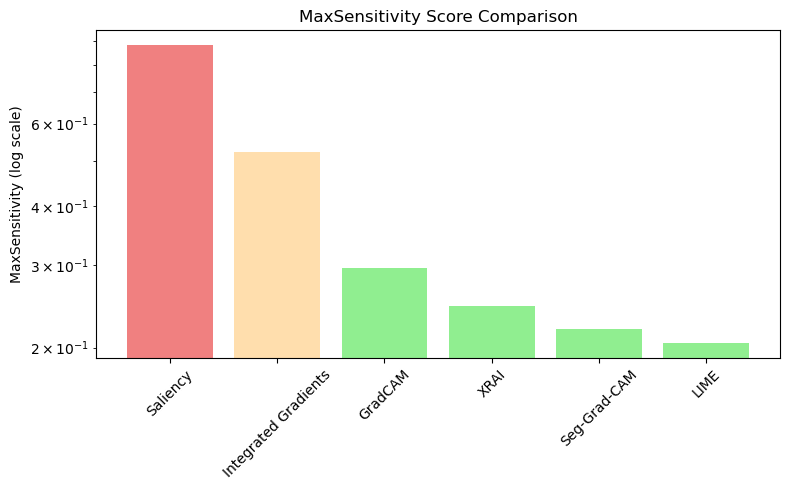

MaxSensitivity Export als: max_df2025-05-01.csv


In [59]:
# Define dynamic bar colors based on MaxSensitivity thresholds
colors = [
    'lightcoral' if val > 0.8 else 'navajowhite' if val > 0.4 else 'lightgreen'
    for val in max_df['MaxSensitivity']
]
# Plot MaxSensitivity Scores with color-coded bars
plt.figure(figsize=(8, 5))
plt.bar(max_df.index, max_df['MaxSensitivity'], color=colors)
plt.yscale("log")
plt.ylabel("MaxSensitivity (log scale)")
plt.title("MaxSensitivity Score Comparison")
plt.grid(axis="y", alpha=0.3)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Export MaxSensitivity scores to CSV with timestamp
now = datetime.now().strftime("%Y-%m-%d")
max_df.to_csv(f'max_df{now}.csv')
print(f"MaxSensitivity Export als: max_df{now}.csv")

In [60]:
# # Display the MaxSensitivity scores for all attribution methods
display(max_df)

,MaxSensitivity
Saliency,0.881454
Integrated Gradients,0.522932
GradCAM,0.295055
XRAI,0.245543
Seg-Grad-CAM,0.218815
LIME,0.204547


To evaluate the robustness of our explainability methods, we used the MaxSensitivity metric from the quantus library. In our implementation, each method (e.g., Saliency, GradCAM, XRAI) generates attribution maps for the input image. We then slightly perturb the input using uniform noise (perturb_func.uniform_noise) and compare the new attribution maps with the originals. 
The difference between original and perturbed maps is measured using the Frobenius norm (norm_func.fro_norm), and this is repeated over 10 samples (nr_samples=10). The average of these differences gives the final MaxSensitivity score for each method.

##### Interpretation:

The  scores reflect how consistent the explanations are when noise is introduced. 
- A high score means that the explanation changes a lot when the input is slightly modified → the method is less robust.
- A low score means that the explanation stays mostly the same → the method is more robust.

##### In our results:

- **Saliency** again exhibits the highest sensitivity (0.881), confirming its instability across semantic classes. Small perturbations to the input lead to major changes in attribution.
- **LIME** is the most robust method (0.205), providing consistent explanations with minimal variation — as already observed for the car class.
- **GradCAM** and **Seg-Grad-CAM** show moderate robustness (0.219 and 0.295), with GradCAM being slightly more sensitive than Seg-Grad-CAM.
- **Integrated Gradients** (0.52) is less reactive than in the car class (was 0.64), indicating improved stability here.
- **XRAI** performs strongly (0.25), suggesting that its region-based aggregation reduces sensitivity without losing coherence.

- Explanations for person were overall more stable than for car across most methods.
- The strongest improvement was seen in **GradCAM**, which shifted from highly sensitive in car to stable in person.
- **Saliency** remains the least robust method in both cases.
- **LIME** offers consistent stability, though its simplicity may overlook finer details.
- The analysis confirms that robustness varies across semantic classes, and no single method is universally superior

However, robustness alone doesn’t guarantee usefulness—stable methods might miss subtle but important features. So MaxSensitivity should be considered as one part of a broader evaluation strategy.

## Pointing Game

In [61]:
def evaluate_pointing_game_heatmaps(methods_dict, segmentation_mask, class_id, model, device="cpu"):
    """
    Evaluates multiple attribution heatmaps using the Quantus Pointing Game metric.

    Parameters:
        methods_dict (dict): Mapping of method names to 2D NumPy heatmaps.
        segmentation_mask (np.ndarray): Ground truth mask for the target object (2D binary).
        class_id (int): Target class label used for evaluation.
        model (torch.nn.Module): PyTorch model (required for Quantus API compatibility).
        device (str): Device on which to run the evaluation (default: "cpu").

    Returns:
        pd.DataFrame: Pointing Game scores for each method, also saved as CSV.
    """

    pointing_scores = {}

    # Validate segmentation mask format
    if segmentation_mask.ndim != 2:
        raise ValueError("Segmentation mask must be 2D.")

    # Prepare mask and dummy input in expected shape: [B, C, H, W]
    s_batch = np.expand_dims(np.expand_dims(segmentation_mask > 0, axis=0), axis=1)
    dummy_x_batch = np.zeros_like(s_batch, dtype=np.float32)
    y_batch = np.array([class_id])

    # Initialize the Pointing Game metric
    pg = PointingGame(
        abs=True,
        normalise=False,
        return_aggregate=False,
        disable_warnings=True
    )

    # Evaluate each attribution method
    for name, heatmap in methods_dict.items():
        try:
            if not isinstance(heatmap, np.ndarray) or heatmap.ndim != 2:
                raise ValueError(f"Heatmap for '{name}' must be a 2D NumPy array.")

            a_batch = np.expand_dims(heatmap, axis=0)  # Shape: [1, H, W]

            # Run the metric
            score_list = pg(
                model=model,
                x_batch=dummy_x_batch,
                y_batch=y_batch,
                a_batch=a_batch,
                s_batch=s_batch,
                device=device
            )

            pointing_scores[name] = float(score_list[0])

        except Exception as e:
            print(f"Error in method '{name}': {e}")
            pointing_scores[name] = None

    # Compile results into a DataFrame
    results_pg = pd.DataFrame.from_dict(pointing_scores, orient="index", columns=["PointingGame"])
    results_pg["PointingGame"] = results_pg["PointingGame"].round(3)

    # Display results in console
    print("\nPointing Game Results:")
    print(results_pg.to_string())

    # Save results to CSV
    now = datetime.now().strftime("%Y-%m-%d")
    csv_path = f"pointing_game_scores_heatmaps_{now}.csv"
    results_pg.to_csv(csv_path)
    print(f"\nResults saved to: {csv_path}")

    return results_pg

In [62]:
# Prepare normalized 2D heatmaps for each method (shape: [H, W])
methods_heatmaps = {
    "LIME": lime_heatmap_resized,
    "GradCAM": grayscale_cam_global.squeeze(),
    "Seg-Grad-CAM": cam_resized,
    "Saliency": sy_boosted,
    "XRAI": attribution.squeeze(),
    "Integrated Gradients": ig_boosted
}

In [63]:
# Prepare ground truth mask as 2D NumPy array (shape: [H, W])
segmentation_mask = out_max.squeeze().cpu().numpy()

In [64]:
# Run Pointing Game evaluation across all heatmaps
results_pg = evaluate_pointing_game_heatmaps(
    methods_dict=methods_heatmaps,
    segmentation_mask=segmentation_mask,
    class_id=person_class_id,
    model=model_cpu,  # Required by Quantus API, but unused in this context
    device="cpu"
)


Pointing Game Results:
                      PointingGame
LIME                           0.0
GradCAM                        1.0
Seg-Grad-CAM                   1.0
Saliency                       0.0
XRAI                           0.0
Integrated Gradients           1.0

Results saved to: pointing_game_scores_heatmaps_2025-05-01.csv


In [65]:
def visualize_top_pixels_grid(image_np, methods_heatmaps, segmentation_mask=None):
    """
    Display input image with top-attribution pixel overlaid for each method.

    Args:
        image_np (np.ndarray): Input image [H, W, 3], unnormalized, float32 [0, 1].
        methods_heatmaps (dict): Mapping {name: 2D heatmap}.
        segmentation_mask (np.ndarray, optional): Ground truth mask [H, W], overlaid if provided.
    """
    num_methods = len(methods_heatmaps)
    ncols = 2
    nrows = int(np.ceil(num_methods / ncols))

    fig, axes = plt.subplots(nrows, ncols, figsize=(8, nrows * 4))
    axes = axes.flatten()

    for ax, (name, heatmap) in zip(axes, methods_heatmaps.items()):
        # Get coordinates of the highest attribution value
        y, x = np.unravel_index(np.argmax(heatmap), heatmap.shape)

        # Show image
        ax.imshow(image_np)

        # Optionally overlay segmentation mask
        if segmentation_mask is not None:
            ax.imshow(segmentation_mask, cmap="jet", alpha=0.3)

        # Mark top-attribution pixel
        ax.scatter(x, y, color='red', s=100, edgecolor='white', linewidth=2)
        ax.set_title(f"{name}\nTop Pixel", fontsize=11)
        ax.axis("off")

    # Hide any unused subplot axes
    for i in range(num_methods, len(axes)):
        axes[i].axis("off")

    plt.tight_layout()
    plt.show()

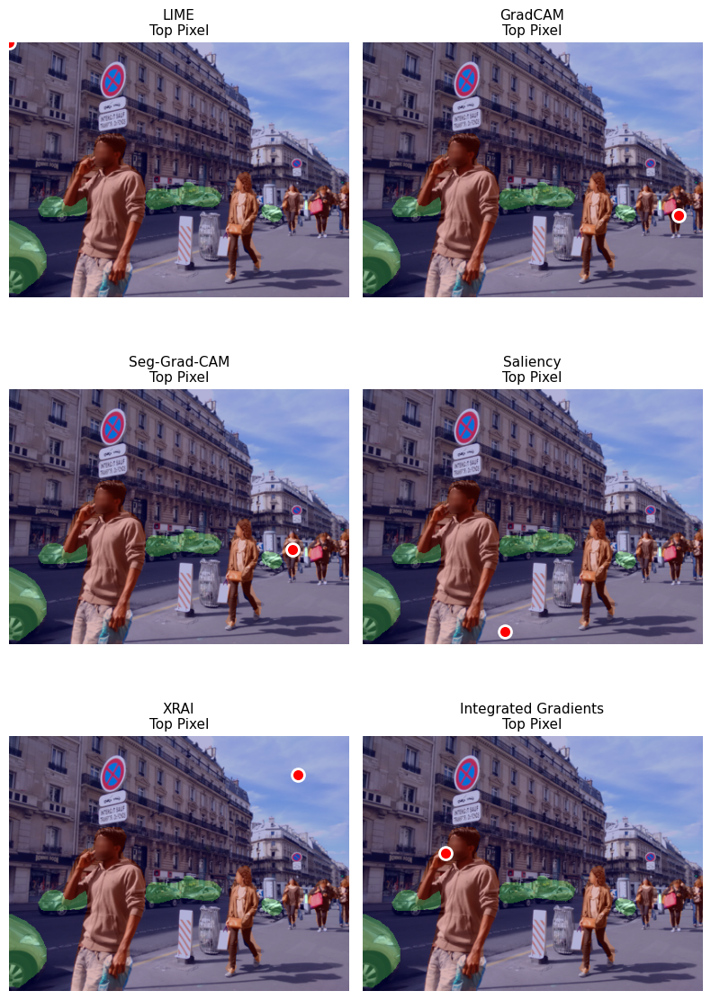

In [66]:
# Visualize top-attribution pixels for each method over the input image
visualize_top_pixels_grid(
    image_np=image_np,                 # Unnormalized input image (H, W, 3), float [0, 1]
    methods_heatmaps=methods_heatmaps,
    segmentation_mask=segmentation_mask  # Ground-truth mask for visual reference
)

##### Pointing Game Interpretation
The Pointing Game metric provides a binary evaluation of saliency maps by measuring whether the most activated pixel - i.e., the pixel with the highest attribution score - falls within the ground truth segmentation mask for the target class. When applied to a single image, the result is either 1.0 (true positive) if the top-scoring pixel lies inside the annotated region, or 0.0 (false positive) if it lies outside. This strict criterion makes the Pointing Game a valuable tool for assessing the localization capability of explanation methods. However, it should be noted that this metric only considers a single point (the global maximum) and thus does not capture the overall distribution of attribution across the object. For larger evaluation sets, the final score would be averaged over multiple samples, resulting in values between 0 and 1.

##### Methodology
The same pipeline was used as in the car example: The pixel with the highest attribution was located using np.argmax() on each heatmap, then compared to a binary mask of the person class. Dummy inputs were passed to the Quantus interface, and attribution maps were used unnormalized. Top pixels were visualized as red dots overlaid on the original image and segmentation mask

##### In our results
The results for person highlight a clear performance separation between methods:
- **GradCAM**, **Seg-Grad-CAM**, and **Integrated Gradients** once again identified their top pixel within the correct object region, achieving perfect localization.
- In contrast, **LIME**, **Saliency**, and notably **XRAI** failed to do so. Their most activated pixels were placed outside the person segmentation mask — for instance, on street signs or unrelated background areas.
- This is especially notable for **XRAI**, which had previously succeeded on the car image but now fails to capture the spatial focus required for the person class. This suggests a possible class- or context-dependency in its effectiveness and reinforces the importance of multi-class testing when evaluating XAI methods.

## Focus

In [67]:
# Normalize attribution map to range [0, 1]
def normalize_attribution(a):
    a = np.squeeze(a)
    
    # If RGB-like (3-channel), average across channels
    if a.ndim == 3 and a.shape[0] == 3:
        a = a.mean(axis=0)

    a = a - a.min()
    a = a / (a.max() + 1e-8)
    return a

In [68]:
# Compute average Focus score for a single instance,
# based on attribution map `a` and class mask `c`
def evaluate_instance_safe(a, c):
    a = normalize_attribution(a)
    c = np.squeeze(c)

    assert a.ndim == 2, f"Invalid attribution shape: {a.shape}"
    assert c.ndim == 2, f"Invalid mask shape: {c.shape}"

    h, w = a.shape
    focus = Focus(mosaic_shape=(1, h, w))

    # Define functions for 4 quadrants
    quadrant_functions_list = [
        focus.quadrant_top_left,
        focus.quadrant_top_right,
        focus.quadrant_bottom_left,
        focus.quadrant_bottom_right,
    ]

    a = a[np.newaxis, :, :]  # Reshape to [1, H, W]

    # Crop class mask into matching quadrants
    masks = [
        c[:h//2, :w//2],
        c[:h//2, w//2:],
        c[h//2:, :w//2],
        c[h//2:, w//2:]
    ]

    # Apply quadrant function only where mask is present
    scores = []
    for mask, func in zip(masks, quadrant_functions_list):
        if np.any(mask):
            scores.append(func(a=a))

    return np.mean(scores) if scores else 0.0


In [69]:
# Evaluate Focus score across all methods
focus_scores = {}
for name, attr in methods.items():
    a = attr  # Attribution heatmap
    c = (replaced_mask_tensor == 13).astype(np.uint8)  # GT mask for class 'person' (ID 13)

    score = evaluate_instance_safe(a=a, c=c)
    focus_scores[name] = score
    print(f"{name}: {score:.4f}")

LIME: 0.9612
GradCAM: 0.0951
Seg-GradCAM: 0.0584
Saliency: 0.0150
XRAI: 0.4605
IG: 0.3729


In [70]:
# Prepare Focus scores as DataFrame and sort by score
focus_df = pd.DataFrame.from_dict(focus_scores, orient='index', columns=['Focus'])
focus_df = focus_df.sort_values(by="Focus", ascending=False)

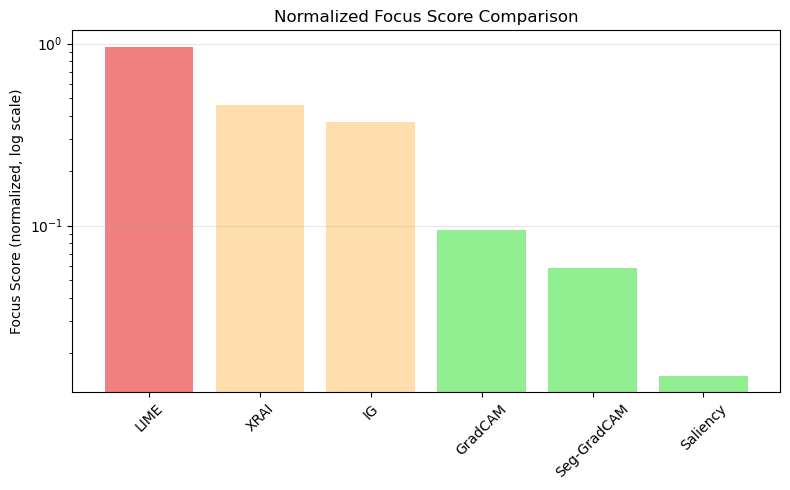

CSV exported: focus_scores_normalized_2025-05-01.csv


In [71]:
# Map bar colors based on score thresholds
bar_colors = [
    'lightcoral' if val > 0.8 else 'navajowhite' if val > 0.1 else 'lightgreen'
    for val in focus_df['Focus']
]

# Plot Focus scores using color-coded bars (log scale)
plt.figure(figsize=(8, 5))
plt.bar(focus_df.index, focus_df['Focus'], color=bar_colors)
plt.yscale("log")
plt.ylabel("Focus Score (normalized, log scale)")
plt.title("Normalized Focus Score Comparison")
plt.grid(axis="y", alpha=0.3)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Export Focus scores to CSV with timestamp
now = datetime.now().strftime("%Y-%m-%d")
focus_df.to_csv(f"focus_scores_normalized_{now}.csv")
print(f"CSV exported: focus_scores_normalized_{now}.csv")

In [72]:
# Display the Focus scores for all attribution methods
display(focus_df)

,Focus
LIME,0.961194
XRAI,0.460524
IG,0.372932
GradCAM,0.095098
Seg-GradCAM,0.058350
Saliency,0.015003


##### Focus Interpretation
The pattern observed for person closely resembles the results for car:

- **LIME** again delivers the best localization in terms of spatial alignment with the target object.
- It achieved a Focus score of 0.961 for car and 0.961 for person — the highest among all methods in both cases.
- **XRAI** and **Integrated Gradients (IG)** maintain moderate performance across both object classes:
  - XRAI: 0.39 (car), 0.46 (person)
  - IG: 0.45 (car), 0.37 (person)
- These values suggest a reasonable ability to capture relevant regions, although not as tightly focused as LIME.
- **GradCAM** and **Seg-Grad-CAM** produce consistently low Focus scores, likely due to their more distributed heatmaps:
  - GradCAM: 0.129 (car), 0.095 (person)
  - Seg-Grad-CAM: 0.122 (car), 0.058 (person)
- These methods often highlight broader scene context rather than object-specific areas.
- **Saliency** remains the weakest method in terms of spatial alignment, with Focus scores of 0.006 (car) and 0.015 (person), indicating highly scattered attributions unrelated to the true object region.

These findings confirm that perturbation-based methods (LIME) and path-integrated approaches (IG) are better suited for explaining spatially grounded predictions in dense tasks like semantic segmentation. In contrast, gradient-based techniques (GradCAM, Seg-Grad-CAM) tend to focus more broadly — sometimes emphasizing contextual features rather than precise object boundaries.

## Effective Compelexity

In [73]:
# Prepare tensor-formatted attributions for evaluation methods (shape: [1, 1, H, W])
methods_explain = {
    "LIME": lime_attr,
    "GradCAM": torch.tensor(grayscale_cam_global).unsqueeze(0).unsqueeze(0),
    "Seg-Grad-CAM": torch.tensor(cam_resized).unsqueeze(0).unsqueeze(0),
    "Saliency": torch.tensor(sy_boosted).unsqueeze(0).unsqueeze(0),
    "XRAI": torch.tensor(attribution).unsqueeze(0).unsqueeze(0),
    "Integrated Gradients": torch.tensor(ig_boosted).unsqueeze(0).unsqueeze(0),
}

In [74]:
# Compute Effective Complexity scores for all explanation methods
eff_complex_scores = {}

for method, attr in methods_explain.items():
    # Convert attribution to NumPy if necessary
    attr_np = attr.detach().cpu().numpy() if isinstance(attr, torch.Tensor) else attr
    x_np = input_tensor.detach().cpu().numpy()
    y_np = out_max.detach().cpu().numpy()

    # Run Effective Complexity metric from Quantus
    eff = quantus.EffectiveComplexity(eps=1e-5)(
        model=model,
        x_batch=x_np,
        y_batch=y_np,
        a_batch=attr_np,
        device="cpu"
    )

    eff_complex_scores[method] = np.mean(eff)

# Create result table
eff_df = pd.DataFrame.from_dict(eff_complex_scores, orient='index', columns=['EffectiveComplexity'])

# Normalize Effective Complexity to [0, 1]
eff_min = eff_df['EffectiveComplexity'].min()
eff_max = eff_df['EffectiveComplexity'].max()
eff_df['EffectiveComplexity_Normed'] = (eff_df['EffectiveComplexity'] - eff_min) / (eff_max - eff_min)

# Sort by normalized score (optional)
eff_df = eff_df.sort_values(by="EffectiveComplexity_Normed", ascending=False)

# Display score table
print("Effective Complexity Scores (Normalized):")
print(eff_df)


Effective Complexity Scores (Normalized):
                      EffectiveComplexity  EffectiveComplexity_Normed
LIME                             374544.0                    1.000000
XRAI                             124848.0                    0.300299
Integrated Gradients             124848.0                    0.300299
Seg-Grad-CAM                      81588.0                    0.179075
GradCAM                           69131.0                    0.144168
Saliency                          17683.0                    0.000000


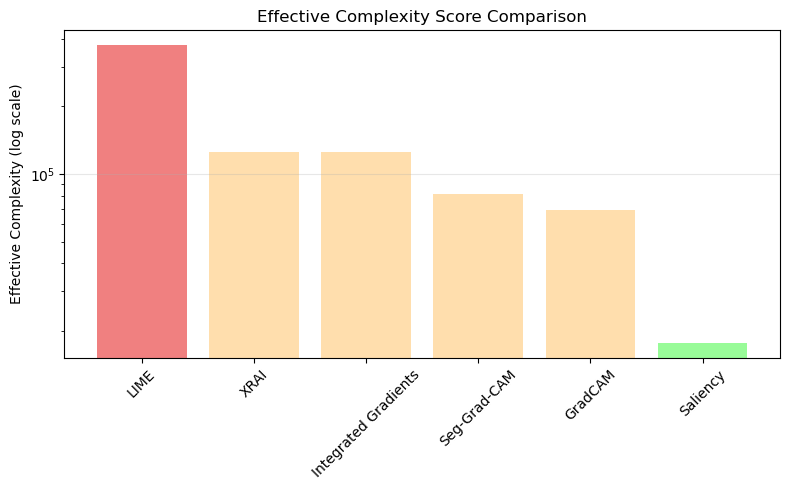

CSV exported: effective_complexity_scores_2025-05-01.csv


In [75]:
# Assign dynamic bar colors based on Effective Complexity thresholds
colors = [
    'lightcoral' if val > 300000 else 'navajowhite' if val > 50000 else 'palegreen'
    for val in eff_df['EffectiveComplexity']
]

# Plot Effective Complexity scores (log-scaled y-axis)
plt.figure(figsize=(8, 5))
plt.bar(eff_df.index, eff_df['EffectiveComplexity'], color=colors)
plt.yscale("log")
plt.ylabel("Effective Complexity (log scale)")
plt.title("Effective Complexity Score Comparison")
plt.grid(axis="y", alpha=0.3)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Export Effective Complexity scores to timestamped CSV
now = datetime.now().strftime("%Y-%m-%d")
eff_df.to_csv(f"effective_complexity_scores_{now}.csv")
print(f"CSV exported: effective_complexity_scores_{now}.csv")

In [76]:
# Display the Effective Complexity scores for all attribution methods
display(eff_df)

,EffectiveComplexity,EffectiveComplexity_Normed
LIME,374544.0,1.000000
XRAI,124848.0,0.300299
Integrated Gradients,124848.0,0.300299
Seg-Grad-CAM,81588.0,0.179075
GradCAM,69131.0,0.144168
Saliency,17683.0,0.000000


##### Effective Complexity Interpretation

To assess the spatial compactness and structural simplicity of the attribution maps, we employed the Effective Complexity metric from the Quantus library. This metric quantifies how dispersed or concentrated the explanations are: higher values indicate more spread-out relevance, while lower values suggest more focused explanations.

The results follow a very similar pattern to those observed for the car class:
- **LIME** again shows the highest complexity (~375k), indicating a broad and spatially distributed attribution pattern. While this may capture global context, it can also include irrelevant regions.
- **XRAI** and **Integrated Gradients** produce moderate complexity (~125k), suggesting a more balanced attribution spread — not overly narrow, but less extensive than LIME.
- **Seg-Grad-CAM** and **GradCAM** result in lower complexity (81k and 69k), reflecting more focused, simpler heatmaps. These methods highlight fewer, more compact regions — often centered around specific object parts.
- **Saliency** yields the lowest complexity (~17k), suggesting extremely tight, sparse activation. However, this may also reflect gradient noise or unstable patterns, as seen in previous metrics.

The Effective Complexity values for person are largely consistent with those for car and indicate that Effective Complexity is largely method-dependent rather than class- or image-dependent:
- LIME: 374,544 (car and person) → highest complexity in both cases.
- XRAI / IG: 124,848 in both images → stable, mid-range complexity.
- Seg-Grad-CAM: 77,229 (car), 81,588 (person).
- GradCAM: 77,069 (car), 69,131 (person).
- Saliency: 9,019 (car), 17,683 (person).

However, high or low complexity is not inherently good or bad. A method with lower complexity may miss relevant areas, while a high complexity score might reflect noise. Therefore, these results should be interpreted in conjunction with Focus, MaxSensitivity, or IROF metrics to assess semantic relevance and robustness.

## Overview (Radar Chart)

In [77]:
# Define evaluation metric categories for radar chart
categories = ["Focus", "MaxSensitivity", "EffectiveComplexity", "IROF"]
num_categories = len(categories)
angles = np.linspace(0, 2 * np.pi, num_categories, endpoint=False).tolist()
angles += angles[:1]  # close radar chart loop

# Map method names for consistency
rename_map = {
    "IG": "Integrated Gradients",
    "Seg-GradCAM": "Seg-Grad-CAM"
}

In [78]:
# Compute mean IROF score per method
irof_mean_scores = {rename_map.get(method, method): np.mean(scores) for method, scores in scores_dict.items()}

# Normalize IROF scores using Min-Max scaling
irof_min, irof_max = min(irof_mean_scores.values()), max(irof_mean_scores.values())
irof_normalized = {
    method: (val - irof_min) / (irof_max - irof_min + 1e-8)
    for method, val in irof_mean_scores.items()
}
irof_df = pd.DataFrame.from_dict(irof_normalized, orient='index', columns=["IROF"])

# Rename method names consistently for other metrics
focus_df.index = focus_df.index.to_series().replace(rename_map)
max_df.index = max_df.index.to_series().replace(rename_map)

# Rename and normalize Effective Complexity
eff_df = max_df.rename(columns={"MaxSensitivity": "EffectiveComplexity"})
eff_df.index = eff_df.index.to_series().replace(rename_map)

# Normalize EffectiveComplexity using Min-Max scaling
eff_min, eff_max = eff_df["EffectiveComplexity"].min(), eff_df["EffectiveComplexity"].max()
eff_df["EffectiveComplexity"] = (eff_df["EffectiveComplexity"] - eff_min) / (eff_max - eff_min + 1e-8)

# Rename method names for Pointing Game results
results_pg.index = results_pg.index.to_series().replace(rename_map)

# Combine all metrics into one DataFrame
combined_df = pd.concat([
    focus_df["Focus"],
    max_df["MaxSensitivity"],
    eff_df["EffectiveComplexity"],
    irof_df["IROF"]
], axis=1)

# Keep only methods with complete data
combined_df = combined_df.dropna()
methods = combined_df.index.tolist()

In [79]:
# Invert metrics where low values are better
metrics_to_invert = ["MaxSensitivity", "EffectiveComplexity"]

for metric in metrics_to_invert:
    combined_df[metric] = 1 - combined_df[metric]

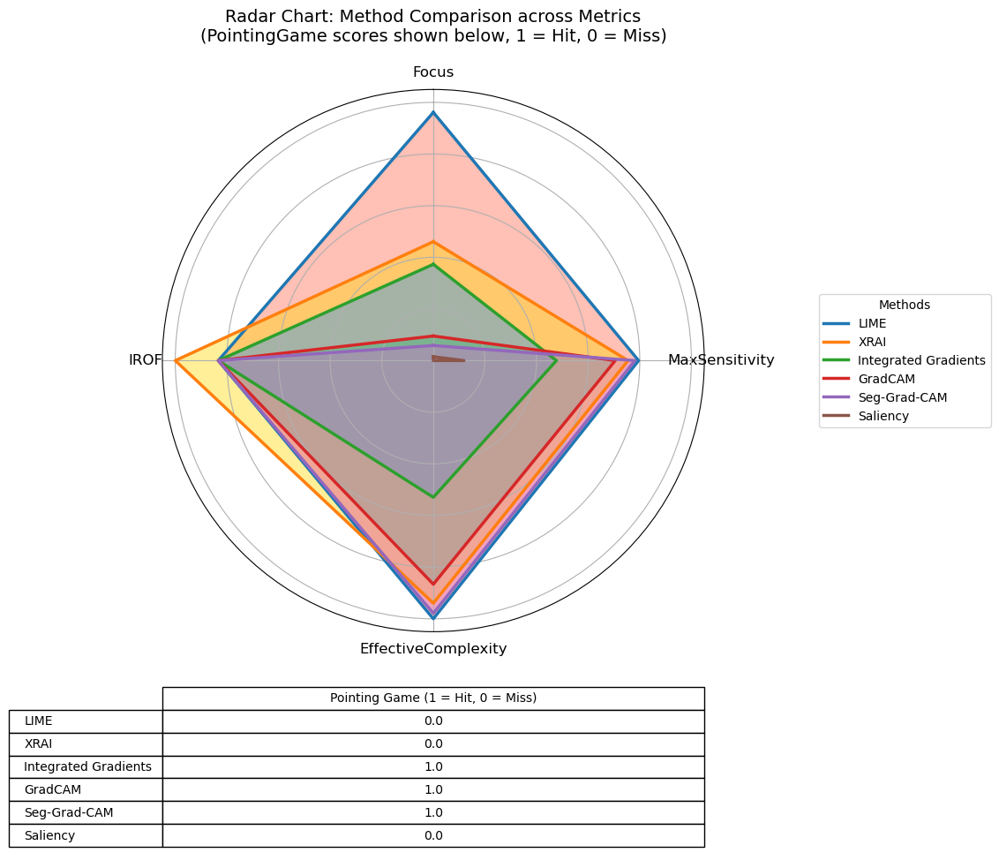

In [80]:
# Assign unique colors per method
colors = {
    "LIME": "tomato",
    "XRAI": "gold",
    "Integrated Gradients": "dodgerblue",
    "GradCAM": "mediumseagreen",
    "Seg-Grad-CAM": "orchid",
    "Saliency": "lightcoral"
}

# Create figure
fig = plt.figure(figsize=(10, 10))
gs = fig.add_gridspec(2, 1, height_ratios=[3, 1])  # 2 rows: radar + table

# --- Radar Chart (ax0) ---
ax0 = plt.subplot(gs[0], polar=True)
ax0.set_theta_offset(np.pi / 2)
ax0.set_theta_direction(-1)

# Plot each method
for method in methods:
    values = combined_df.loc[method, categories].tolist()
    values += values[:1]  # close the radar plot loop
    ax0.plot(angles, values, linewidth=2.5, linestyle='solid', label=method)
    ax0.fill(angles, values, color=colors.get(method, 'gray'), alpha=0.4)

ax0.set_xticks(angles[:-1])
ax0.set_xticklabels(categories, fontsize=12)
ax0.set_yticklabels([])
ax0.set_title("Radar Chart: Method Comparison across Metrics\n(PointingGame scores shown below, 1 = Hit, 0 = Miss)",
              size=14, pad=20)

ax0.legend(loc='center left', bbox_to_anchor=(1.2, 0.5), fontsize=10, title="Methods")

# --- Table (ax1) ---
ax1 = plt.subplot(gs[1])
ax1.axis('off')

pointing_table = results_pg.loc[methods, ["PointingGame"]]
table = ax1.table(
    cellText=pointing_table.values,
    colLabels=["Pointing Game (1 = Hit, 0 = Miss)"],
    rowLabels=[f"{method}" for method in pointing_table.index],
    loc='center',
    cellLoc='center'
)
table.scale(1, 1.3)  # Adjust table height

plt.tight_layout()
plt.show()

In [81]:
print("\nOverview of methods in radar chart (rounded to 3 decimals):\n")
print(combined_df.round(3))


Overview of methods in radar chart (rounded to 3 decimals):

                      Focus  MaxSensitivity  EffectiveComplexity   IROF
LIME                  0.961           0.795                1.000  0.833
XRAI                  0.461           0.754                0.939  1.000
Integrated Gradients  0.373           0.477                0.530  0.833
GradCAM               0.095           0.705                0.866  0.833
Seg-Grad-CAM          0.058           0.781                0.979  0.833
Saliency              0.015           0.119                0.000  0.000


To summarize and compare the overall performance of the different XAI methods, the core evaluation metrics were visualized in a radar chart. The selected metrics include:

- Focus: Higher values indicate stronger alignment with the relevant object region.
- MaxSensitivity: Lower values are better, indicating more robust explanations under noise.
- Effective Complexity: Lower values are better, reflecting simpler and more compact attribution maps.
- IROF: Higher values represent better attribution relevance when important regions are removed.

However, since these metrics differ in their ideal value orientation, the following adjustments were made to allow direct visual comparison:

- Inversion: For metrics where lower is better (MaxSensitivity and Effective Complexity), the values were inverted by computing 1 − value.
- Min-Max Normalization: All metrics were scaled independently to a [0,1] range to ensure comparability.

As a result, a larger filled area in the radar chart always reflects a better-performing method.

#### Results – Person Class 
- **LIME** performs exceptionally in **Focus** and **Effective Complexity**, but scores zero (normalized) in **IROF**, indicating that the regions it highlights may not strongly influence the prediction when removed.
- **GradCAM** shows the best **IROF** score (1.0), demonstrating that its attribution strongly aligns with prediction-relevant regions, despite poor **Focus** alignment.
- **Seg-Grad-CAM** provides a balanced profile, particularly in **IROF** and complexity, though **Focus** remains low.
- **XRAI** and **IG** exhibit moderate, more balanced values across all metrics.
- **Saliency** underperforms in nearly all categories, confirming its instability and poor spatial focus.

#### Comparison to Car (Image 1)
- **LIME** performs consistently well in **Focus** (0.961) and **Effective Complexity** (1.000, highest spread). Unlike in the car case, where its **IROF** was 0.000, **LIME** now achieves a substantial **IROF** of 0.833 for person. This indicates that its explanations for person are not only visually aligned but also have measurable impact, in contrast to its purely visual usefulness for car.
- **GradCAM** reaches an **IROF** of 0.833, significantly higher than for car (0.368), showing stronger attribution relevance. However, its **Focus** drops from 0.129 to 0.095, and **MaxSensitivity** increases (0.375 → 0.705), reflecting reduced spatial precision and robustness.
- **Seg-Grad-CAM** follows a similar pattern: **IROF** increases (0.368 → 0.833), **Focus** drops (0.122 → 0.058), and **MaxSensitivity** rises (0.451 → 0.781). This suggests better functual attribution but worse interpretability.
- **XRAI** maintains perfect **IROF** (1.000) across both classes. Its **Focus** improves slightly (0.399 → 0.461), but robustness decreases (**MaxSensitivity** 0.683 → 0.754), indicating increased sensitivity to noise.
- **Integrated Gradients (IG)** shows moderate improvements in **IROF** (0.179 → 0.833) for person, but Focus declines (0.448 → 0.373), and **MaxSensitivity** increases (0.367 → 0.477), indicating improved relevance but less stability.
- **Saliency** performs poorly across all metrics for person: **Focus** remains extremely low (0.015), **IROF** drops to 0.000, and **MaxSensitivity** remains high (0.119, compared to 0.030 for car). While **Saliency** previously showed at least some influence for car (IROF: 0.558), it fails entirely for person.

#### Summary
The evaluation confirms that **XAI methods behave differently depending on the object class**.

For **structured and compact objects** like *cars*, methods such as **GradCAM** and **XRAI** provide explanations that are **functionally impactful** (high IROF), though sometimes spatially imprecise. **LIME**, while offering **highly focused and interpretable heatmaps** (Focus: 0.961), proves to be **functionally irrelevant** in this context (IROF: 0.000) — acting more as a visual than a causal explanation tool.

For **more complex and variable objects** like *persons*, the situation shifts:  
**LIME** demonstrates the **most dramatic improvement**, evolving from a purely visual method to one that also **meaningfully affects model predictions** (IROF: 0.833). **GradCAM** and **Seg-Grad-CAM** likewise gain in attribution relevance (↑ IROF), but their heatmaps become **more diffuse** (Focus < 0.1) and **less robust** under input noise (↑ MaxSensitivity), likely due to increased activation spread for smaller or occluded objects.

**XRAI** remains a strong method overall, achieving **consistently high IROF** across classes, but shows signs of **overgeneralization**, as indicated by increased Effective Complexity and reduced robustness.  
**Integrated Gradients (IG)** offers a **moderate trade-off**: its relevance improves for *person*, but this comes at the expense of focus and stability.  
**Saliency**, despite a minimal increase in Focus, **fails entirely for person** (IROF: 0.000) and remains **the least reliable method overall** due to its instability and lack of spatial coherence.

Across almost all methods, **robustness decreases** for the *person* class, highlighting the challenge of explaining predictions for semantically diffuse or small-scale objects.

In conclusion, the results suggest that **no XAI method is universally superior**. Instead, their interpretability and effectiveness depend on both the **explained object class** and the **underlying model behavior**:

- **LIME** performs well in terms of spatial precision and robustness, particularly for visually detailed or occlusion-prone objects, but shows limited influence on the model’s prediction in some cases.
- **GradCAM** and **Seg-Grad-CAM** identify functionally relevant regions (high IROF), but struggle with spatial precision and robustness.
- **XRAI** offers balanced performance, but may lack class-specific localisation.
- **Integrated Gradients** performs moderately well, with fragmented but causally relevant maps.
- **Saliency** fails across most criteria due to instability and lack of spatial 
focus. 
